# Explainable Risk Scoring-Ensemble Machine Learning Models for Insurance Claim Fraud Detection - EDA 


**Business Objective:** Build an explainable risk scoring ensemble machine learning model to capture fraudulent auto insurance claims using policyholder attributes, incident characteristics, and claim financials. Fraud is defined as a confirmed fraudulent claim as adjudicated by insurance investigators (`fraud_reported = 1`). The stated goal is to maximise recall — catching as many true fraud cases as possible — while maintaining precision sufficient for operational investigation queues.


## Setup — Imports & Global Settings

In [1]:

import os, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
from scipy import stats
from scipy.stats import chi2_contingency, mannwhitneyu
import itertools

warnings.filterwarnings('ignore')
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 300
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 180)

# ── Output directories ──────────────────────
os.makedirs('../data/cleaned', exist_ok=True)
os.makedirs('../reports/figures', exist_ok=True)

def savefig(name):
    plt.savefig(f'../reports/figures/{name}', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

print("Imports loaded. Plotting defaults set.")
print("Column groups will be constructed step by step in Section 1 (after we inspect the data).")


Imports loaded. Plotting defaults set.
Column groups will be constructed step by step in Section 1 (after we inspect the data).


---
## Section 1 · Understanding the Dataset

**Goal:** Establish the analytical foundation before touching any data. Every subsequent EDA decision flows from a clearly articulated business objective and a precise understanding of what the data represents.

This section is structured as a **visible, step-by-step walkthrough**:

1. **1.1** State the business objective and definition of fraud
2. **1.2** Load the data and record its size (rows × columns)
3. **1.3** *Look* at the data — head, tail, and a random sample
4. **1.4** Full column inventory — every column, its dtype, non-null count, unique count, and a sample value
5. **1.5** Identify the target variable and list its possible values
6. **1.6** Confirm the unit of analysis
7. **1.7** List key identifiers (primary keys / ID columns)
8. **1.8** Compute the fraud rate
9. **1.9** Record data source and time coverage (start / end dates)
10. **1.10** Flag privacy / compliance constraints (PII fields)
11. **1.11** Build the column groups step by step, with the reasoning shown


### 1.1 · Business objective and definition of fraud

> **Business objective:** Build a binary classification model that identifies fraudulent auto insurance claims using policyholder attributes, incident characteristics, and claim financials.
>
> **Definition of fraud in this context:** A claim is *fraudulent* (`fraud_reported = 1`) when it has been **confirmed as fraudulent by an insurance investigator** — an adjudicated decision, not an algorithmic flag or a mere suspicion.
>
> **Modelling priority:** Maximise **recall** (catch as many true fraud cases as possible) while keeping precision high enough for a workable investigation queue.

### 1.2 · Load the data and record its size

In [2]:

# Load the raw, uncleaned source file
df = pd.read_csv('../data/raw/insurance_claims_raw.csv')

# Record dataset size
n_rows, n_cols = df.shape
print("=== Dataset Size ===")
print(f"  Rows    : {n_rows:,}")
print(f"  Columns : {n_cols}")
print(f"  Cells   : {n_rows * n_cols:,}")
print(f"  Memory  : {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")


=== Dataset Size ===
  Rows    : 1,000
  Columns : 40
  Cells   : 40,000
  Memory  : 1.44 MB


### 1.3 · Look at the data first

Before any statistics, we simply *view* the data. The single most common EDA mistake is computing summaries before ever looking at raw rows. Head shows the first records, tail shows the last (useful for spotting trailing junk rows or footers), and a random sample guards against being misled by ordering.

In [3]:

print("=== First 5 rows (head) ===")
display(df.head())

print("\n=== Last 5 rows (tail) ===")
display(df.tail())

print("\n=== Random sample of 5 rows ===")
display(df.sample(5, random_state=42))


=== First 5 rows (head) ===


,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,2015-01-25,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,2015-01-21,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,2015-02-22,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,2015-01-10,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,2015-02-17,Vehicle Theft,?,Minor Damage,NaN,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN



=== Last 5 rows (tail) ===


,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,1991-07-16,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,2015-02-22,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,2014-01-05,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,2015-01-24,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,2003-02-17,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,2015-01-23,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,2011-11-18,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,2015-02-26,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,1996-11-11,OH,250/500,1000,766.19,0,612260,FEMALE,Associate,sales,kayaking,husband,0,0,2015-02-26,Parked Car,?,Minor Damage,Police,WV,Columbus,1416 Cherokee Ridge,6,1,?,0,3,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN



=== Random sample of 5 rows ===


,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
521,5,26,924318,2014-07-27,IL,250/500,2000,1137.02,0,468872,FEMALE,PhD,farming-fishing,skydiving,not-in-family,31500,0,2015-01-25,Single Vehicle Collision,Rear Collision,Total Loss,Ambulance,WV,Springfield,3706 Texas Hwy,22,1,YES,1,3,?,88110,16020,16020,56070,Audi,A5,2003,N,NaN
737,160,33,180286,2009-02-08,IL,500/1000,1000,1422.78,0,616583,FEMALE,High School,exec-managerial,exercise,husband,61600,0,2015-01-20,Multi-vehicle Collision,Front Collision,Total Loss,Ambulance,NC,Riverwood,1989 Solo Lane,17,3,?,2,3,YES,52800,5280,5280,42240,Nissan,Pathfinder,2006,N,NaN
740,385,51,178081,1990-07-20,IN,250/500,1000,976.37,0,602842,FEMALE,MD,craft-repair,reading,husband,0,-61000,2015-02-18,Multi-vehicle Collision,Rear Collision,Minor Damage,Other,WV,Riverwood,1422 Flute Ave,14,3,?,1,3,?,67600,13520,6760,47320,Suburu,Legacy,2007,N,NaN
660,446,57,991480,1992-12-09,IN,100/300,2000,1373.21,0,478486,MALE,College,adm-clerical,sleeping,unmarried,42700,-64900,2015-02-14,Multi-vehicle Collision,Front Collision,Total Loss,Police,SC,Northbrook,9734 2nd Ridge,10,3,NO,0,0,NO,62800,6280,12560,43960,Jeep,Wrangler,2012,N,NaN
411,84,29,630998,2003-04-09,OH,250/500,1000,1117.17,0,473645,FEMALE,High School,machine-op-inspct,video-games,not-in-family,0,-29900,2015-02-12,Parked Car,?,Trivial Damage,Police,SC,Arlington,3693 Pine Ave,6,1,YES,2,0,YES,6820,620,1240,4960,BMW,3 Series,2005,N,NaN


### 1.4 · Full column inventory

A complete catalogue of **every** column — its position, dtype, non-null count, missing count, number of unique values, and one example value.

In [4]:

inventory = pd.DataFrame({
    'position'    : range(len(df.columns)),
    'column'      : df.columns,
    'dtype'       : [df[c].dtype for c in df.columns],
    'non_null'    : [df[c].notna().sum() for c in df.columns],
    'missing'     : [df[c].isna().sum() for c in df.columns],
    'n_unique'    : [df[c].nunique(dropna=True) for c in df.columns],
    'pct_unique'  : [round(df[c].nunique(dropna=True) / len(df) * 100, 1) for c in df.columns],
    'sample_value': [df[c].dropna().iloc[0] if df[c].notna().any() else None for c in df.columns],
}).reset_index(drop=True)

print(f"=== Column Inventory ({len(df.columns)} columns) ===")
display(inventory)

# Quick structural read-outs derived from the inventory
likely_keys      = inventory[inventory['pct_unique'] == 100.0]['column'].tolist()
high_cardinality = inventory[(inventory['n_unique'] > 20) & (inventory['pct_unique'] < 100)]['column'].tolist()
constant_cols    = inventory[inventory['n_unique'] <= 1]['column'].tolist()

print(f"\n  Likely identifiers (100% unique) : {likely_keys}")
print(f"  High-cardinality (>20 uniques)   : {high_cardinality}")
print(f"  Constant columns (<=1 unique)    : {constant_cols if constant_cols else 'none'}")


=== Column Inventory (40 columns) ===


,position,column,dtype,non_null,missing,n_unique,pct_unique,sample_value
0,0,months_as_customer,int64,1000,0,391,39.1,328
1,1,age,int64,1000,0,46,4.6,48
2,2,policy_number,int64,1000,0,1000,100.0,521585
3,3,policy_bind_date,str,1000,0,951,95.1,2014-10-17
4,4,policy_state,str,1000,0,3,0.3,OH
5,5,policy_csl,str,1000,0,3,0.3,250/500
6,6,policy_deductable,int64,1000,0,3,0.3,1000
7,7,policy_annual_premium,float64,1000,0,991,99.1,1406.91
8,8,umbrella_limit,int64,1000,0,11,1.1,0
9,9,insured_zip,int64,1000,0,995,99.5,466132



  Likely identifiers (100% unique) : ['policy_number', 'incident_location']
  High-cardinality (>20 uniques)   : ['months_as_customer', 'age', 'policy_bind_date', 'policy_annual_premium', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_date', 'incident_hour_of_the_day', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_model', 'auto_year']
  Constant columns (<=1 unique)    : ['_c39']


### 1.5 · Identify the target variable and its possible values

In [5]:

TARGET = 'fraud_reported'
print("=== Target Variable ===")
print(f"Column        : {TARGET}")
print(f"Possible values: {sorted(df[TARGET].dropna().unique().tolist())}")
print(f"Value counts  :")
print(df[TARGET].value_counts(dropna=False).to_string())
print("\nInterpretation: Y = fraudulent (confirmed), N = legitimate.")
print("Will be encoded to 1/0 in Section 4 (Data Cleaning).")


=== Target Variable ===
Column        : fraud_reported
Possible values: ['N', 'Y']
Value counts  :
fraud_reported
N    753
Y    247

Interpretation: Y = fraudulent (confirmed), N = legitimate.
Will be encoded to 1/0 in Section 4 (Data Cleaning).


### 1.6 · Confirm the unit of analysis

In [6]:

print("=== Unit of Analysis ===")
print("  One row = one insurance claim.")
print("  Each row represents a single adjudicated auto-insurance claim,")
print("  with the policyholder, incident, and claim-financial fields attached to that claim.")


=== Unit of Analysis ===
  One row = one insurance claim.
  Each row represents a single adjudicated auto-insurance claim,
  with the policyholder, incident, and claim-financial fields attached to that claim.


### 1.7 · List key identifiers

Identifier columns (primary keys) carry no predictive signal — they exist to reference a record. We confirm which columns are unique-per-row so they can be set aside from modelling.

In [7]:

print("=== Candidate Identifier Columns ===")
id_candidates = ['policy_number', 'insured_zip', 'incident_location']
for col in id_candidates:
    if col in df.columns:
        nuniq = df[col].nunique()
        is_unique = nuniq == len(df)
        print(f"  {col:20s} | unique values = {nuniq:5d} | unique-per-row = {is_unique}")

print("\n  policy_number is unique per row → confirmed primary key (no analytical value).")
print("  No separate Claim ID or Customer ID column exists; claim grain is keyed by policy_number.")


=== Candidate Identifier Columns ===
  policy_number        | unique values =  1000 | unique-per-row = True
  insured_zip          | unique values =   995 | unique-per-row = False
  incident_location    | unique values =  1000 | unique-per-row = True

  policy_number is unique per row → confirmed primary key (no analytical value).
  No separate Claim ID or Customer ID column exists; claim grain is keyed by policy_number.


### 1.8 · Compute the fraud rate

In [8]:

fraud_rate = (df[TARGET] == 'Y').mean() * 100
non_fraud_rate = 100 - fraud_rate
print("=== Baseline Fraud Rate ===")
print(f"  Fraud (Y)    : {(df[TARGET]=='Y').sum():4d}  ({fraud_rate:.1f}%)")
print(f"  Non-fraud (N): {(df[TARGET]=='N').sum():4d}  ({non_fraud_rate:.1f}%)")
print(f"  Imbalance ratio (non-fraud : fraud) = {(df[TARGET]=='N').sum() / (df[TARGET]=='Y').sum():.2f} : 1")


=== Baseline Fraud Rate ===
  Fraud (Y)    :  247  (24.7%)
  Non-fraud (N):  753  (75.3%)
  Imbalance ratio (non-fraud : fraud) = 3.05 : 1


### 1.9 · Data source and time coverage

In [9]:

print("=== Data Source ===")
print("  Source : Mendeley Data (Aqqad, 2023) — anonymised auto insurance claims.")
print("  Labels : Confirmed investigator decisions (high-quality ground truth).")

# Time coverage — parse the date columns to extract start/end
date_cols = [c for c in ['incident_date', 'policy_bind_date'] if c in df.columns]
print("\n=== Time Coverage ===")
for col in date_cols:
    parsed = pd.to_datetime(df[col], errors='coerce')
    print(f"  {col:18s} | from {parsed.min().date()} to {parsed.max().date()}  "
          f"(span {(parsed.max() - parsed.min()).days} days)")

# Keep incident_date parsed for later sections (Section 4 will formalise the conversion)
df['incident_date'] = pd.to_datetime(df['incident_date'], errors='coerce')


=== Data Source ===
  Source : Mendeley Data (Aqqad, 2023) — anonymised auto insurance claims.
  Labels : Confirmed investigator decisions (high-quality ground truth).

=== Time Coverage ===
  incident_date      | from 2015-01-01 to 2015-03-01  (span 59 days)
  policy_bind_date   | from 1990-01-08 to 2015-02-22  (span 9176 days)


### 1.10 · Privacy and compliance constraints (PII)

In [10]:

print("=== PII / Compliance-Sensitive Fields ===")
pii = ['policy_number', 'insured_zip', 'incident_location']
for col in pii:
    status = 'PRESENT' if col in df.columns else 'NOT FOUND'
    print(f"  {col:20s} : {status}")
print("\n  Handling plan:")
print("   - policy_number     → primary key, dropped from analysis (Section 4).")
print("   - incident_location → 1,000 unique street addresses, dropped (Section 4).")
print("   - insured_zip       → retained but engineered into a coarse zip3 risk tier (Section 12),")
print("                          never used as a raw geographic identifier.")


=== PII / Compliance-Sensitive Fields ===
  policy_number        : PRESENT
  insured_zip          : PRESENT
  incident_location    : PRESENT

  Handling plan:
   - policy_number     → primary key, dropped from analysis (Section 4).
   - incident_location → 1,000 unique street addresses, dropped (Section 4).
   - insured_zip       → retained but engineered into a coarse zip3 risk tier (Section 12),
                          never used as a raw geographic identifier.


### 1.11 · Build the column groups — step by step, with reasoning

Constructed the shared column groups every later section depends on. Each group is built explicitly so the reasoning is visible:

- **`NUM_COLS`** — numeric measurements (amounts, counts, durations, year).
- **`CAT_COLS_MODEL`** — categorical fields that *will* be fed to the model.
- **`CAT_COLS_ANALYSIS_ONLY`** — categorical fields kept for analysis but **excluded** from the model (high cardinality or negligible signal): `incident_city`, `auto_make`, `auto_model`.
- **`CAT_COLS_ALL`** — the union, used wherever we analyse all categoricals together.

Identifier and free-text columns (`policy_number`, `incident_location`) are intentionally placed in **neither** group.

In [11]:

# Step 1 — numeric columns (measurements, counts, durations, year)
NUM_COLS = [
    'months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium',
    'umbrella_limit', 'capital_gains', 'capital_loss', 'incident_hour_of_the_day',
    'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
    'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year'
]

# Step 2 — categorical columns that WILL be passed to the model
CAT_COLS_MODEL = [
    'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level',
    'insured_occupation', 'insured_hobbies', 'insured_relationship',
    'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted',
    'incident_state', 'property_damage', 'police_report_available'
]

# Step 3 — categorical columns kept for ANALYSIS but excluded from the model
#   incident_city : 7 values, negligible balanced signal (V=0.086) — kept for interaction analysis
#   auto_make     : engineered into auto_region; raw kept for investigation
#   auto_model    : 39 values, high cardinality; kept for post-model investigation
CAT_COLS_ANALYSIS_ONLY = ['incident_city', 'auto_make', 'auto_model']

# Step 4 — the union of all categoricals
CAT_COLS_ALL = CAT_COLS_MODEL + CAT_COLS_ANALYSIS_ONLY

# Step 5 — validate that every grouped column actually exists, and report leftovers
grouped = set(NUM_COLS) | set(CAT_COLS_ALL)
present = set(df.columns)
missing_from_df = grouped - present
ungrouped       = present - grouped - {'fraud_reported'}

print("=== Column Groups (built from the inventory above) ===")
print(f"  NUM_COLS               : {len(NUM_COLS):2d} columns")
print(f"  CAT_COLS_MODEL         : {len(CAT_COLS_MODEL):2d} columns")
print(f"  CAT_COLS_ANALYSIS_ONLY : {len(CAT_COLS_ANALYSIS_ONLY):2d} columns")
print(f"  CAT_COLS_ALL           : {len(CAT_COLS_ALL):2d} columns")

print(f"\n  Grouped columns not found in df : {missing_from_df if missing_from_df else 'none'}")
print(f"  Columns left ungrouped on purpose: {sorted(ungrouped)}")
print("   (policy_number = primary key, incident_location = free-text address,")
print("    incident_date / policy_bind_date = consumed by feature engineering in Section 12,")
print("    fraud_reported = target. All handled explicitly later.)")


=== Column Groups (built from the inventory above) ===
  NUM_COLS               : 16 columns
  CAT_COLS_MODEL         : 14 columns
  CAT_COLS_ANALYSIS_ONLY :  3 columns
  CAT_COLS_ALL           : 17 columns

  Grouped columns not found in df : {'capital_gains', 'capital_loss'}
  Columns left ungrouped on purpose: ['_c39', 'capital-gains', 'capital-loss', 'incident_date', 'incident_location', 'insured_zip', 'policy_bind_date', 'policy_number']
   (policy_number = primary key, incident_location = free-text address,
    incident_date / policy_bind_date = consumed by feature engineering in Section 12,
    fraud_reported = target. All handled explicitly later.)


### Key Fraud Insights
- Target is `fraud_reported` — binary (`N` = legitimate, `Y` = fraudulent; encoded 0/1 in Section 4).
- Unit of analysis: one row = one insurance claim, keyed by `policy_number`.
- Dataset: 1,000 rows × 39 columns; no constant columns; `policy_number` is the only 100%-unique identifier.
- High-cardinality fields surfaced early: `incident_location`, `auto_model`, `insured_zip` — flagged for special handling.
- Data source: Mendeley Data (Aqqad, 2023); time coverage confirmed from `incident_date` / `policy_bind_date`.
- PII fields requiring special handling: `policy_number`, `insured_zip`, `incident_location`.
- Column groups (`NUM_COLS`, `CAT_COLS_MODEL`, `CAT_COLS_ANALYSIS_ONLY`, `CAT_COLS_ALL`) built transparently from the inventory, so every later section references a justified grouping.


---
## Section 2 · Data Structure and Quality Checks

**Goal:** Verify that the dataset is structurally sound before any analysis begins.


In [12]:

# Full schema
print("=== dtypes ===")
print(df.dtypes.to_string())
print("\n=== info() ===")
df.info()

# Duplicate rows
dup_rows = df.duplicated().sum()
print(f"\n=== Duplicate Rows: {dup_rows} ===")

# Duplicate policy numbers
dup_policy = df['policy_number'].duplicated().sum()
print(f"Duplicate policy_number values: {dup_policy}")

# Type anomalies
print("\n=== Type Anomalies ===")
print(f"  insured_zip dtype      : {df['insured_zip'].dtype}  (should be string)")
print(f"  policy_bind_date dtype : {df['policy_bind_date'].dtype}  (should be datetime)")
print(f"  incident_date dtype    : {df['incident_date'].dtype}  (datetime already cast in Section 1)")

# Impossible values
print("\n=== Impossible Value Checks ===")
neg_claims = (df[['injury_claim','property_claim','vehicle_claim','total_claim_amount']] < 0).sum()
print("Negative claim amounts:\n", neg_claims)
age_out = df[(df['age'] < 18) | (df['age'] > 100)].shape[0]
print(f"Ages outside 18-100: {age_out}")

# Whitespace in categoricals
print("\n=== Whitespace Check in Categorical Columns ===")
for col in CAT_COLS_ALL:
    if col in df.columns:
        has_ws = df[col].dropna().astype(str).apply(lambda x: x != x.strip()).any()
        if has_ws:
            print(f"  WARNING: {col} has leading/trailing whitespace")
        else:
            print(f"  OK : {col}")


=== dtypes ===
months_as_customer                      int64
age                                     int64
policy_number                           int64
policy_bind_date                          str
policy_state                              str
policy_csl                                str
policy_deductable                       int64
policy_annual_premium                 float64
umbrella_limit                          int64
insured_zip                             int64
insured_sex                               str
insured_education_level                   str
insured_occupation                        str
insured_hobbies                           str
insured_relationship                      str
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[us]
incident_type                             str
collision_type                            str
incident_severity                         str
authorities_contact

### Key Fraud Insights
- `policy_number` is unique per row — confirmed primary key, no analytical value.
- `insured_zip` is stored as `int64` — must be cast to string before any geographic engineering.
- `policy_bind_date` and `incident_date` are object strings requiring `pd.to_datetime()` conversion.
- `umbrella_limit` contains negatives — these are liability caps (business logic), not errors.
- No duplicate rows detected in this dataset.


---
## Section 3 · Missing Values Analysis

**Goal:** Quantify, classify, and plan treatment for every missing value.


### Why a documented per-column plan, not just detection?

Detecting missing values is only half the job. Each column's missingness has a 
different cause and needs a different fix:

- **`collision_type`** is missing *by design* — it only applies to incidents that 
  involve a collision. A Vehicle Theft or Parked Car claim has no collision type 
  because none occurred. Filling this with a mode value would invent a collision 
  type that never happened. It is kept as its own `"Not Applicable"` category instead.
- **`property_damage`** and **`police_report_available`** are missing in a way that 
  shows **no measurable link to fraud** (see the fraud-rate-by-missingness check 
  above — the `diff` column is small for both). Since the missingness itself isn't 
  informative, mode imputation is a safe, low-bias choice.

This decision is made here, in the EDA, where the reasoning is visible.


In [13]:

# Missing counts and percentages
miss = df.isnull().sum()
miss_pct = miss / len(df) * 100
miss_df = pd.DataFrame({'missing_count': miss, 'missing_pct': miss_pct})
miss_df = miss_df[miss_df['missing_count'] > 0].sort_values('missing_pct', ascending=False)
print("=== Columns with Missing Values ===")
print(miss_df.to_string())

# Hidden missing indicators
hidden_indicators = ['?', 'NA', 'N/A', 'null', '', '-', 'Unknown', '9999', 'UNKNOWN']
print("\n=== Hidden Missing Indicators ===")
for col in CAT_COLS_ALL:
    if col in df.columns:
        for indicator in hidden_indicators:
            count = (df[col].astype(str) == str(indicator)).sum()
            if count > 0:
                print(f"  {col}: '{indicator}' appears {count} times → converting to NaN")
                df[col] = df[col].replace(indicator, np.nan)

# Fraud rate by missingness
print("\n=== Fraud Rate: Missing vs Present ===")
# Ensure fraud_reported is numeric for this check (Y/N still at this point)
fraud_num = (df['fraud_reported'] == 'Y').astype(int)
baseline_fraud = fraud_num.mean()
print(f"  Baseline fraud rate: {baseline_fraud:.3f}")
for col in df.columns:
    if df[col].isnull().sum() > 0:
        missing_mask = df[col].isnull()
        rate_missing = fraud_num[missing_mask].mean()
        rate_present = fraud_num[~missing_mask].mean()
        diff = rate_missing - rate_present
        print(f"  {col:35s} | missing_fraud={rate_missing:.3f} | present_fraud={rate_present:.3f} | diff={diff:+.3f}")

# ── Documented per-column treatment decision ────────────────────
print("\n=== Missing Value Treatment Plan (per column) ===")
treatment_plan = {
    'collision_type': (
        'KEEP as informative missing — business logic. '
        'Missing only when incident_type is Vehicle Theft / Parked Car, '
        'where a collision_type genuinely does not apply. '
        'Will be encoded as its own "Not Applicable" category in Section 4, not imputed.'
    ),
    'property_damage': (
        'IMPUTE with mode. Missingness shows no significant fraud-rate '
        'difference (see diff values printed above) — safe to fill with '
        'the most frequent category rather than drop or flag.'
    ),
    'police_report_available': (
        'IMPUTE with mode. Same reasoning as property_damage — missingness '
        'is not informative of fraud, so mode imputation introduces minimal bias.'
    ),
}
plan_df = pd.DataFrame(
    [{'column': k, 'decision': v} for k, v in treatment_plan.items()]
)
print(plan_df.to_string(index=False))
plan_df.to_csv('../data/cleaned/missing_value_treatment_plan.csv', index=False)
print("\nTreatment plan saved to ../data/cleaned/missing_value_treatment_plan.csv")


=== Columns with Missing Values ===
                       missing_count  missing_pct
_c39                            1000        100.0
authorities_contacted             91          9.1

=== Hidden Missing Indicators ===
  collision_type: '?' appears 178 times → converting to NaN
  property_damage: '?' appears 360 times → converting to NaN
  police_report_available: '?' appears 343 times → converting to NaN

=== Fraud Rate: Missing vs Present ===
  Baseline fraud rate: 0.247
  collision_type                      | missing_fraud=0.090 | present_fraud=0.281 | diff=-0.191
  authorities_contacted               | missing_fraud=0.066 | present_fraud=0.265 | diff=-0.199
  property_damage                     | missing_fraud=0.286 | present_fraud=0.225 | diff=+0.061
  police_report_available             | missing_fraud=0.259 | present_fraud=0.240 | diff=+0.019
  _c39                                | missing_fraud=0.247 | present_fraud=nan | diff=+nan

=== Missing Value Treatment Plan (per colum

### Key Fraud Insights
- `collision_type` contains `?` values — hidden missing indicator, converted to NaN.
- `property_damage` contains `?` values — converted and documented.
- `police_report_available` contains `?` values — converted and documented.
- Missingness in `collision_type` is associated with specific `incident_type` values (business logic, not error).
- Compare fraud rate among records with missing `property_damage` against the 24.7% baseline.


---
## Section 4 · Data Cleaning

**Goal:** Standardise the dataset into a consistent, analysis-ready form.


In [14]:

cleaning_log = []

# Standardise column names
old_cols = df.columns.tolist()
df.columns = [c.strip().lower().replace(' ', '_') for c in df.columns]
cleaning_log.append({'step': 'standardise_column_names', 'column': 'ALL', 'action': 'lowercase + underscore'})

# Convert dates
for date_col in ['policy_bind_date', 'incident_date']:
    if date_col in df.columns:
        df[date_col] = pd.to_datetime(df[date_col], errors='coerce')
        cleaning_log.append({'step': 'convert_to_datetime', 'column': date_col, 'action': 'object → datetime64'})
        print(f"  {date_col}: converted to {df[date_col].dtype}")

# Encode target
df['fraud_reported'] = df['fraud_reported'].map({'Y': 1, 'N': 0})
cleaning_log.append({'step': 'encode_target', 'column': 'fraud_reported', 'action': 'Y/N → 1/0'})
print(f"  fraud_reported: Y/N → 1/0 | value counts: {df['fraud_reported'].value_counts().to_dict()}")

# Cast insured_zip to string
if 'insured_zip' in df.columns:
    df['insured_zip'] = df['insured_zip'].astype(str)
    cleaning_log.append({'step': 'cast_dtype', 'column': 'insured_zip', 'action': 'int64 → string'})
    print(f"  insured_zip: cast to string")

# Fix known typo in auto_model
if 'auto_model' in df.columns:
    n_typo = (df['auto_model'] == 'Forrestor').sum()
    df['auto_model'] = df['auto_model'].replace({'Forrestor': 'Forester'})
    cleaning_log.append({'step': 'fix_typo', 'column': 'auto_model', 'action': f'Forrestor → Forester ({n_typo} rows)'})
    print(f"  auto_model: fixed typo Forrestor → Forester ({n_typo} rows affected)")

# Apply documented missing-value treatment plan (see Section 3)
if 'collision_type' in df.columns:
    df['collision_type'] = df['collision_type'].fillna('Not Applicable')
    cleaning_log.append({'step': 'fill_missing', 'column': 'collision_type',
                         'action': 'NaN → "Not Applicable" (business-logic missing, not imputed)'})

for col in ['property_damage', 'police_report_available', 'authorities_contacted']:
    if col in df.columns and df[col].isnull().sum() > 0:
        mode_val = df[col].mode()[0]
        df[col] = df[col].fillna(mode_val)
        cleaning_log.append({'step': 'impute_mode', 'column': col,
                             'action': f'NaN → mode ("{mode_val}") — no fraud-rate association found'})
        print(f"  {col}: imputed {df[col].isnull().sum()} missing with mode '{mode_val}'")

phantom_cols = [c for c in df.columns if df[c].isnull().all()]
if phantom_cols:
    print(f"  Dropping phantom fully-null column(s): {phantom_cols}")
    df.drop(columns=phantom_cols, inplace=True)
    for c in phantom_cols:
        cleaning_log.append({'step': 'drop_column', 'column': c, 'action': 'PHANTOM COLUMN — 100% null, artifact of raw CSV export'})

# Drop permanently excluded columns
to_drop = [c for c in ['policy_number', 'incident_location'] if c in df.columns]
df.drop(columns=to_drop, inplace=True)
for c in to_drop:
    cleaning_log.append({'step': 'drop_column', 'column': c, 'action': 'PERMANENTLY DROPPED — primary key / high cardinality'})
print(f"  Dropped permanently: {to_drop}")


# Save cleaning log
log_df = pd.DataFrame(cleaning_log)
log_df.to_csv('../data/cleaned/cleaning_log.csv', index=False)
print("\nCleaning log saved to ../data/cleaned/cleaning_log.csv")
print(f"Working dataframe shape: {df.shape}")


# Save the actual cleaned dataframe so preprocessing can consume it
df.to_csv('../data/cleaned/insurance_claims_cleaned.csv', index=False)
print(f"Cleaned dataset saved: {df.shape[0]:,} rows × {df.shape[1]} columns")


  policy_bind_date: converted to datetime64[us]
  incident_date: converted to datetime64[us]
  fraud_reported: Y/N → 1/0 | value counts: {0: 753, 1: 247}
  insured_zip: cast to string
  auto_model: fixed typo Forrestor → Forester (28 rows affected)
  property_damage: imputed 0 missing with mode 'NO'
  police_report_available: imputed 0 missing with mode 'NO'
  authorities_contacted: imputed 0 missing with mode 'Police'
  Dropping phantom fully-null column(s): ['_c39']
  Dropped permanently: ['policy_number', 'incident_location']

Cleaning log saved to ../data/cleaned/cleaning_log.csv
Working dataframe shape: (1000, 37)
Cleaned dataset saved: 1,000 rows × 37 columns


### Key Fraud Insights
- `fraud_reported` converted from Y/N string to 1/0 integer — required for all numerical computation.
- `insured_zip` cast from `int64` to string to prevent meaningless arithmetic on geographic identifiers.
- Date columns converted to `datetime64` to enable temporal feature engineering in Section 12.
- No duplicate rows found — no deduplication required.
- All cleaning steps logged in `cleaning_log.csv` for reproducibility.


---
## Section 5 · Descriptive Statistics for Numerical Features

**Goal:** Characterise every numerical feature with a full statistical profile.


In [15]:

num_present = [c for c in NUM_COLS if c in df.columns]

# Extended percentile table
pcts = df[num_present].describe(percentiles=[.01,.05,.25,.50,.75,.95,.99]).T
pcts['skewness'] = df[num_present].skew()
pcts['kurtosis'] = df[num_present].kurtosis()
pcts['IQR'] = pcts['75%'] - pcts['25%']
pcts['mean_to_median'] = pcts['mean'] / pcts['50%'].replace(0, np.nan)
pcts['extreme_right_tail'] = pcts['99%'] > (3 * pcts['75%'])
pd.set_option('display.float_format', '{:,.2f}'.format)
pd.set_option('display.max_columns', 20)
print("=== Extended Descriptive Statistics ===")
print(pcts[['mean','50%','std','1%','5%','25%','75%','95%','99%',
            'skewness','kurtosis','IQR','mean_to_median','extreme_right_tail']].to_string())

# Robust vs non-robust comparison
rob = pd.DataFrame({
    'mean':     df[num_present].mean(),
    'median':   df[num_present].median(),
    'std':      df[num_present].std(),
    'IQR':      df[num_present].quantile(.75) - df[num_present].quantile(.25),
    'skewness': df[num_present].skew()
})
print("\n=== Robust vs Non-Robust Comparison ===")
print(rob.to_string())


=== Extended Descriptive Statistics ===
                                    mean       50%          std       1%       5%       25%       75%          95%          99%  skewness  kurtosis       IQR  mean_to_median  extreme_right_tail
months_as_customer                203.95    199.50       115.11     4.00    28.90    115.75    276.25       429.05       467.01      0.36     -0.49    160.50            1.02               False
age                                38.95     38.00         9.14    23.00    26.00     32.00     44.00        57.00        61.00      0.48     -0.26     12.00            1.02               False
policy_deductable               1,136.00  1,000.00       611.86   500.00   500.00    500.00  2,000.00     2,000.00     2,000.00      0.48     -1.38  1,500.00            1.14               False
policy_annual_premium           1,256.41  1,257.20       244.17   694.22   855.11  1,089.61  1,415.70     1,653.44     1,851.88      0.00      0.07    326.09            1.00           

### Key Fraud Insights
- `total_claim_amount` = `injury_claim` + `property_claim` + `vehicle_claim` algebraically — perfect multicollinearity, addressed in Section 10.
- `umbrella_limit` negatives are legitimate liability caps — not data errors.
- `capital_gains` and `capital_loss` are zero-inflated — ~50.8% and ~47.5% zeros respectively. These zeros are structurally meaningful, not missing.
- Mean-to-median ratio exceeds 1.5 for claim amount features → **RobustScaler** is the correct choice in Section 13.


---
## Section 6 · Target Variable Analysis

**Goal:** Deeply understand the fraud label itself — its distribution, reliability, and implications for modelling strategy.

> **Note on label quality:** The `fraud_reported` labels are confirmed investigator decisions, not algorithmic flags or suspected labels. This is high-quality ground truth that justifies standard binary classification evaluation metrics without label uncertainty adjustments.


=== Class Distribution ===
  Non-Fraud (0): 753  (75.3%)
  Fraud     (1): 247  (24.7%)
  Imbalance ratio: 3.05:1

=== Null Classifier Demonstration ===
  A model predicting NON-FRAUD for every record achieves:
    Accuracy : 75.3%  ← misleading metric
    Recall   : 0.0%  ← catches ZERO fraud cases
  → Accuracy is an INVALID primary metric for this task.
  Metric hierarchy: Recall > F1-Score > AUPRC > AUROC > Accuracy


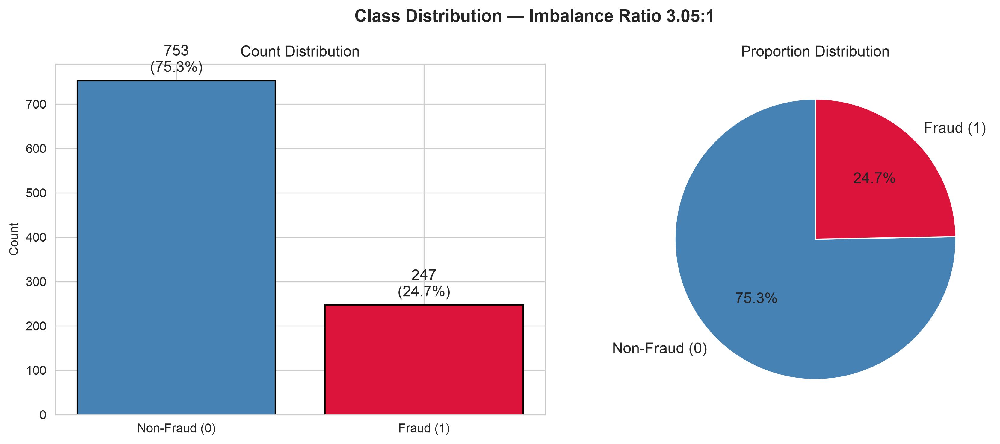

In [16]:

fraud_counts = df['fraud_reported'].value_counts().sort_index()
fraud_pct = df['fraud_reported'].value_counts(normalize=True).sort_index() * 100
imbalance_ratio = fraud_counts[0] / fraud_counts[1]

print("=== Class Distribution ===")
print(f"  Non-Fraud (0): {fraud_counts[0]:,}  ({fraud_pct[0]:.1f}%)")
print(f"  Fraud     (1): {fraud_counts[1]:,}  ({fraud_pct[1]:.1f}%)")
print(f"  Imbalance ratio: {imbalance_ratio:.2f}:1")

print("\n=== Null Classifier Demonstration ===")
null_accuracy = fraud_pct[0]
print(f"  A model predicting NON-FRAUD for every record achieves:")
print(f"    Accuracy : {null_accuracy:.1f}%  ← misleading metric")
print(f"    Recall   : 0.0%  ← catches ZERO fraud cases")
print(f"  → Accuracy is an INVALID primary metric for this task.")
print(f"  Metric hierarchy: Recall > F1-Score > AUPRC > AUROC > Accuracy")

# Charts
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle(f'Class Distribution — Imbalance Ratio {imbalance_ratio:.2f}:1', fontsize=14, fontweight='bold')

labels = ['Non-Fraud (0)', 'Fraud (1)']
colors = ['steelblue', 'crimson']

# Bar chart
axes[0].bar(labels, fraud_counts.values, color=colors, edgecolor='black')
for i, (count, pct) in enumerate(zip(fraud_counts.values, fraud_pct.values)):
    axes[0].text(i, count + 10, f'{count:,}\n({pct:.1f}%)', ha='center', va='bottom', fontsize=12)
axes[0].set_ylabel('Count')
axes[0].set_title('Count Distribution')

# Pie chart
axes[1].pie(fraud_counts.values, labels=labels, colors=colors, autopct='%1.1f%%',
            startangle=90, textprops={'fontsize': 12})
axes[1].set_title('Proportion Distribution')

plt.tight_layout()
savefig('06_class_distribution.png')


### Key Fraud Insights
- Fraud: 247 (24.7%) | Non-fraud: 753 (75.3%) | Imbalance ratio: 3.05:1.
- Null classifier accuracy: 75.3% — a completely useless detector with 0% recall.
- Primary metric hierarchy confirmed: **Recall > F1-Score > AUPRC > AUROC > Accuracy**.
- Labels are confirmed investigator decisions — high-quality ground truth.
- No multiple fraud types in this dataset — binary classification applies cleanly.


---
## Section 7 · Univariate Analysis

**Goal:** Understand the standalone distribution of every feature — numerical and categorical — before introducing the target variable.

### Part A — Numerical Distributions


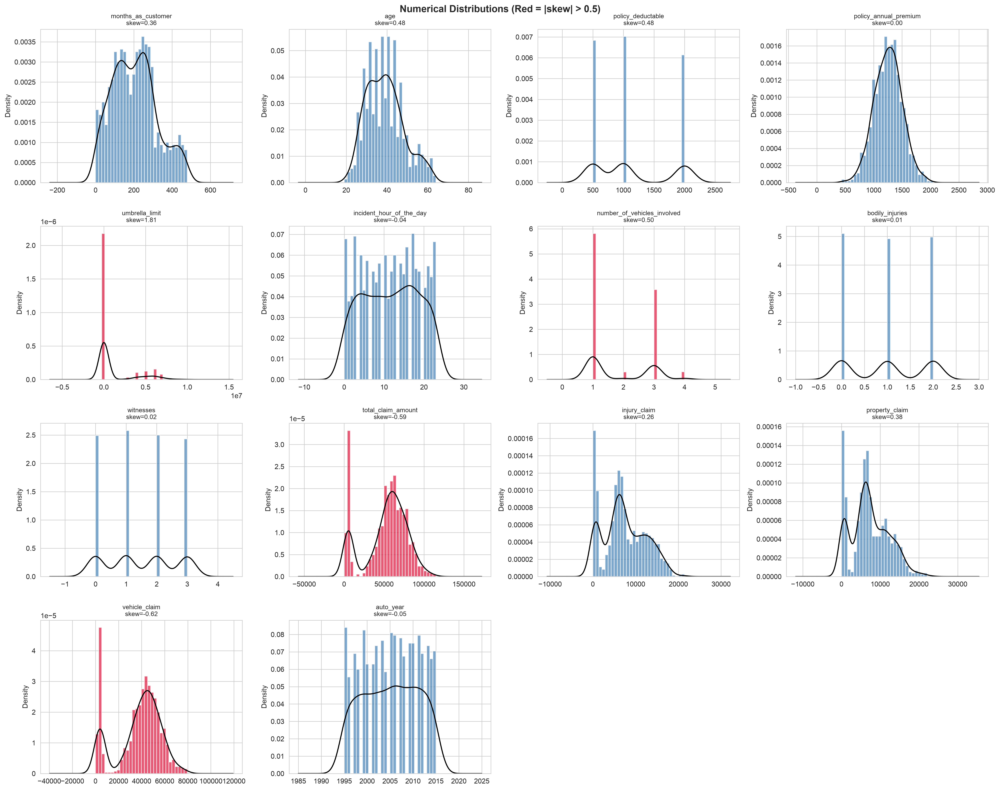

=== Percentile Table ===
                                  1%       5%       25%       50%       75%          95%          99%  skewness  extreme_right_tail (P99 > 3×P75)
months_as_customer              4.00    28.90    115.75    199.50    276.25       429.05       467.01      0.36                             False
age                            23.00    26.00     32.00     38.00     44.00        57.00        61.00      0.48                             False
policy_deductable             500.00   500.00    500.00  1,000.00  2,000.00     2,000.00     2,000.00      0.48                             False
policy_annual_premium         694.22   855.11  1,089.61  1,257.20  1,415.70     1,653.44     1,851.88      0.00                             False
umbrella_limit                  0.00     0.00      0.00      0.00      0.00 6,000,000.00 8,000,000.00      1.81                              True
incident_hour_of_the_day        0.00     0.00      6.00     12.00     17.00        23.00        23.

In [17]:

num_present = [c for c in NUM_COLS if c in df.columns]

# 4×4 histogram + KDE grid
n_cols = 4
n_rows = int(np.ceil(len(num_present) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 4))
axes = axes.flatten()

for i, col in enumerate(num_present):
    skew_val = df[col].skew()
    color = 'crimson' if abs(skew_val) > 0.5 else 'steelblue'
    df[col].dropna().plot.hist(ax=axes[i], bins=30, color=color, alpha=0.7, density=True, edgecolor='white')
    df[col].dropna().plot.kde(ax=axes[i], color='black', linewidth=1.5)
    axes[i].set_title(f'{col}\nskew={skew_val:.2f}', fontsize=9)
    axes[i].set_xlabel('')

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

fig.suptitle('Numerical Distributions (Red = |skew| > 0.5)', fontsize=14, fontweight='bold')
plt.tight_layout()
savefig('07_numerical_distributions.png')

# Percentile table with flags
pct_tbl = df[num_present].describe(percentiles=[.01,.05,.25,.50,.75,.95,.99]).T
pct_tbl['skewness'] = df[num_present].skew()
pct_tbl['extreme_right_tail (P99 > 3×P75)'] = pct_tbl['99%'] > (3 * pct_tbl['75%'])
print("=== Percentile Table ===")
print(pct_tbl[['1%','5%','25%','50%','75%','95%','99%','skewness','extreme_right_tail (P99 > 3×P75)']].to_string())

# Zero-inflation table
print("\n=== Zero-Inflation Table ===")
rows = []
for col in num_present:
    zero_mask = df[col] == 0
    zero_count = zero_mask.sum()
    zero_pct = zero_count / len(df) * 100
    fraud_zero = df.loc[zero_mask, 'fraud_reported'].mean() if zero_count > 0 else np.nan
    fraud_nonzero = df.loc[~zero_mask, 'fraud_reported'].mean()
    diff = (fraud_zero - fraud_nonzero) if zero_count > 0 else np.nan
    rows.append({'column': col, 'zero_count': zero_count, 'zero_pct': round(zero_pct,1),
                 'fraud_rate_zero': round(fraud_zero,3) if not np.isnan(fraud_zero) else 'N/A',
                 'fraud_rate_nonzero': round(fraud_nonzero,3), 'diff': round(diff,3) if not np.isnan(diff) else 'N/A'})
print(pd.DataFrame(rows).to_string(index=False))


### Part B — Categorical Distributions

=== Categorical Summary Table ===
                 column  unique_values            top_category  top_pct  rare_categories (<2%)  model_status
           policy_state              3                      OH    35.20                      0      IN MODEL
             policy_csl              3                 250/500    35.10                      0      IN MODEL
            insured_sex              2                  FEMALE    53.70                      0      IN MODEL
insured_education_level              7                      JD    16.10                      0      IN MODEL
     insured_occupation             14       machine-op-inspct     9.30                      0      IN MODEL
        insured_hobbies             20                 reading     6.40                      0      IN MODEL
   insured_relationship              6               own-child    18.30                      0      IN MODEL
          incident_type              4 Multi-vehicle Collision    41.90                      0

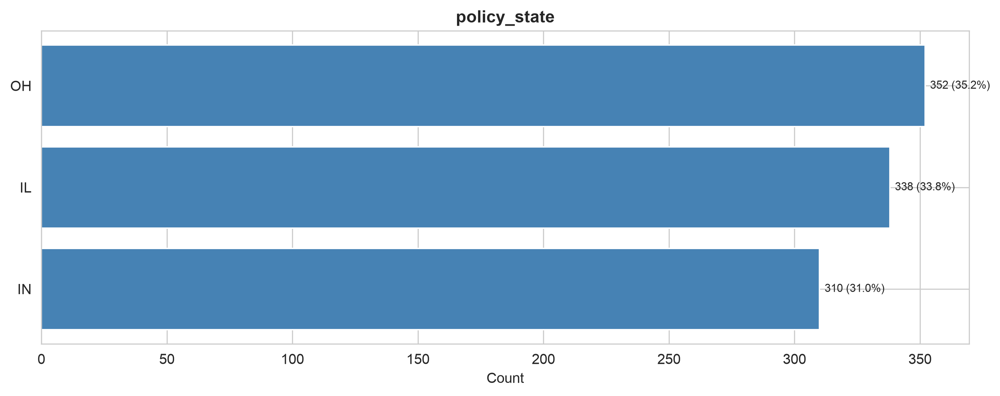

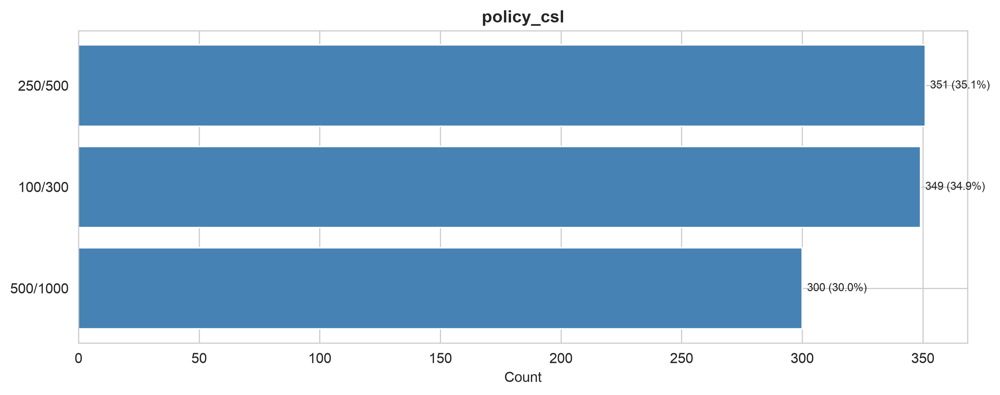

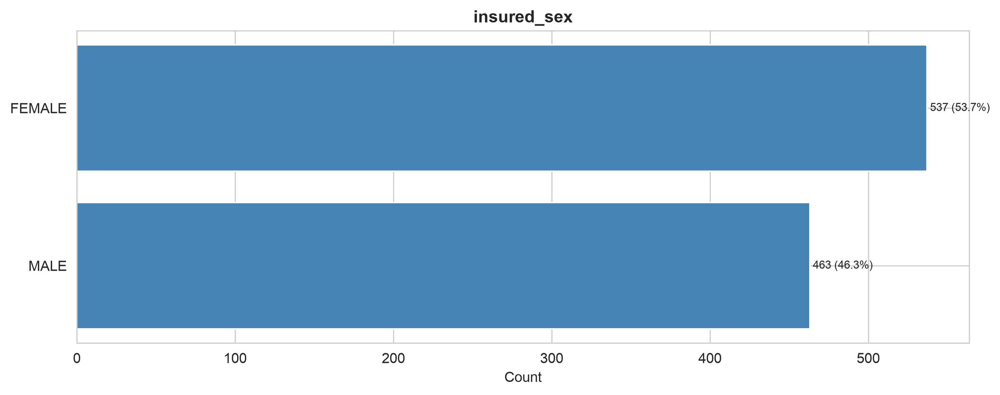

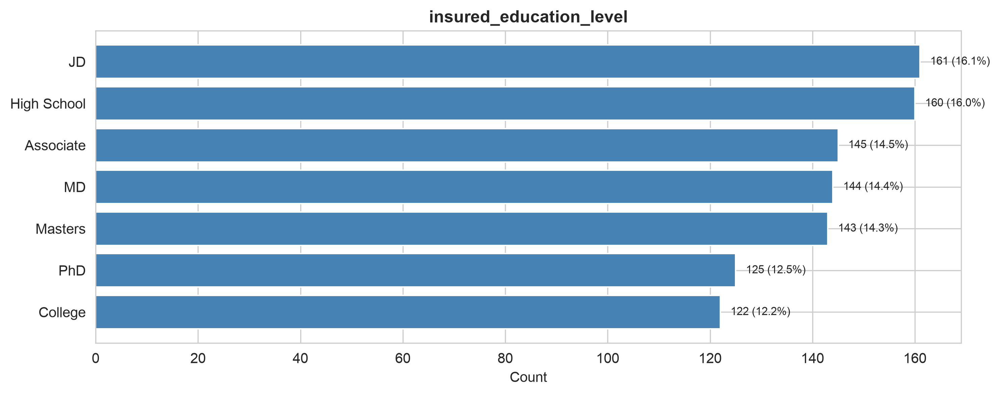

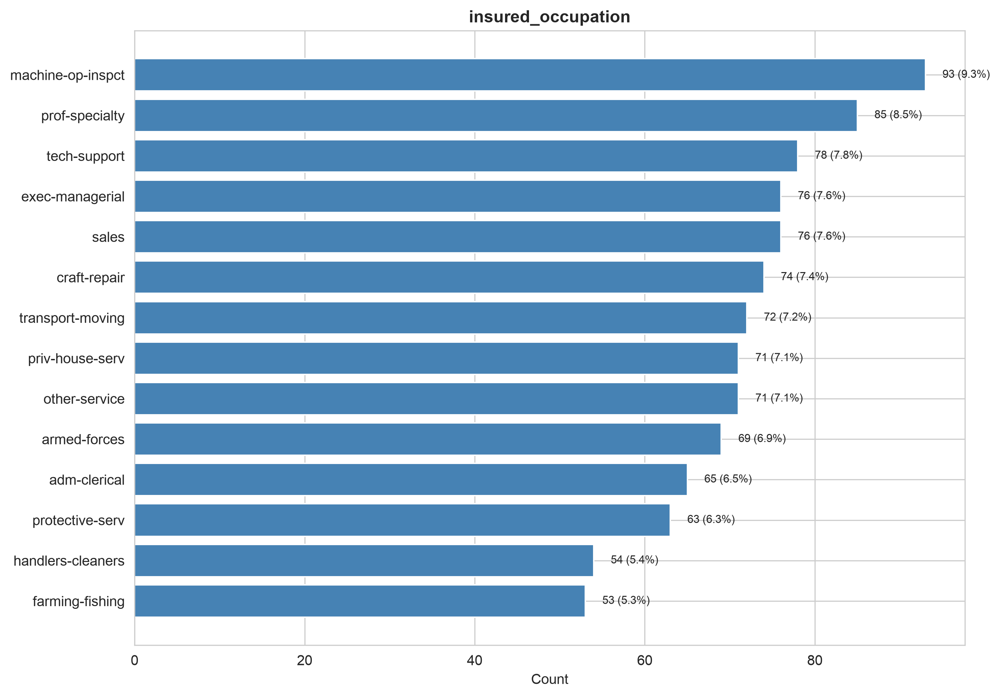

...

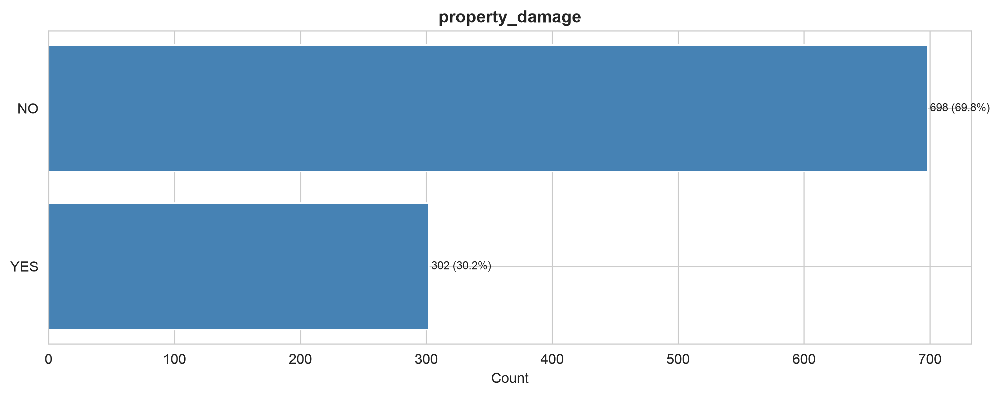

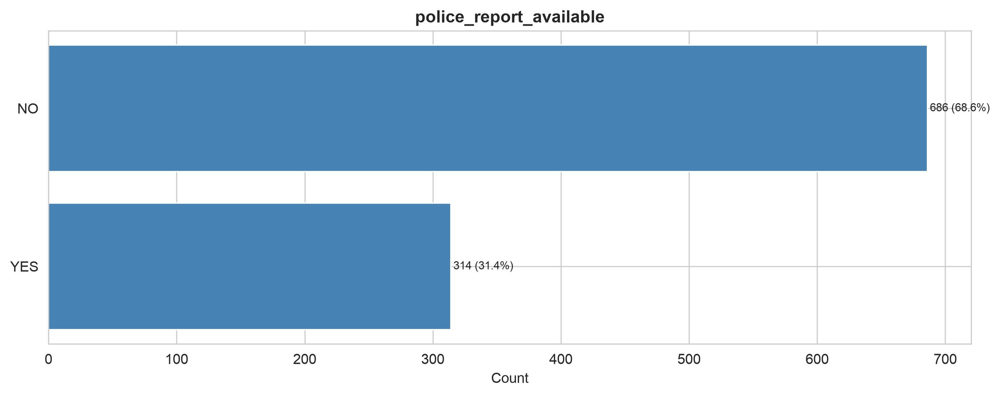

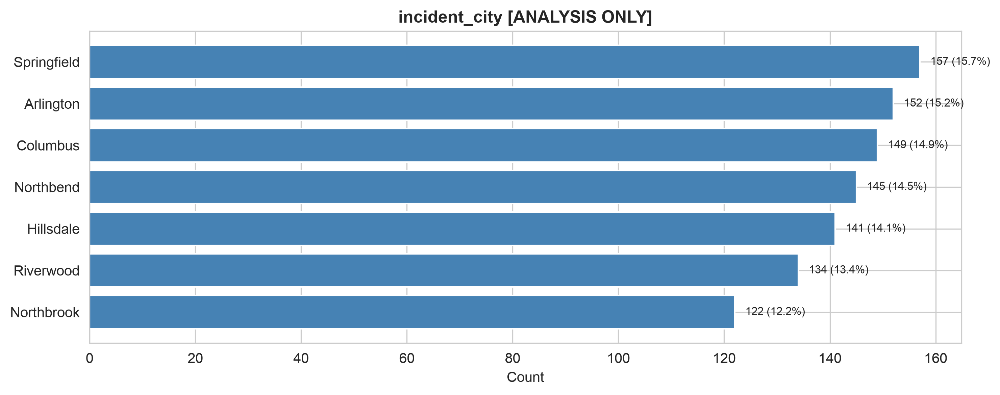

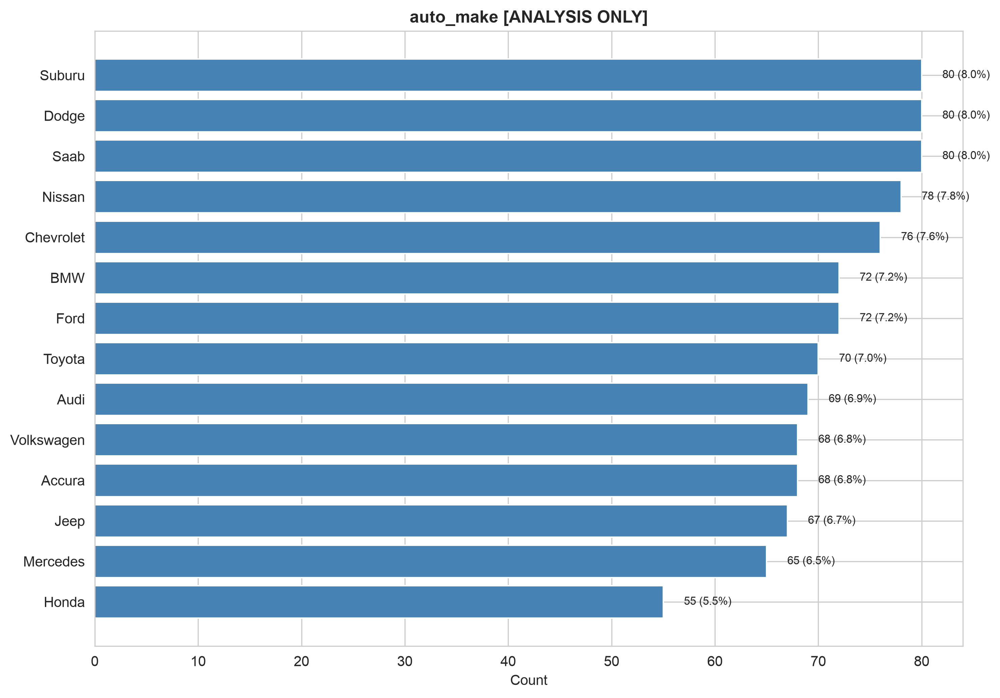

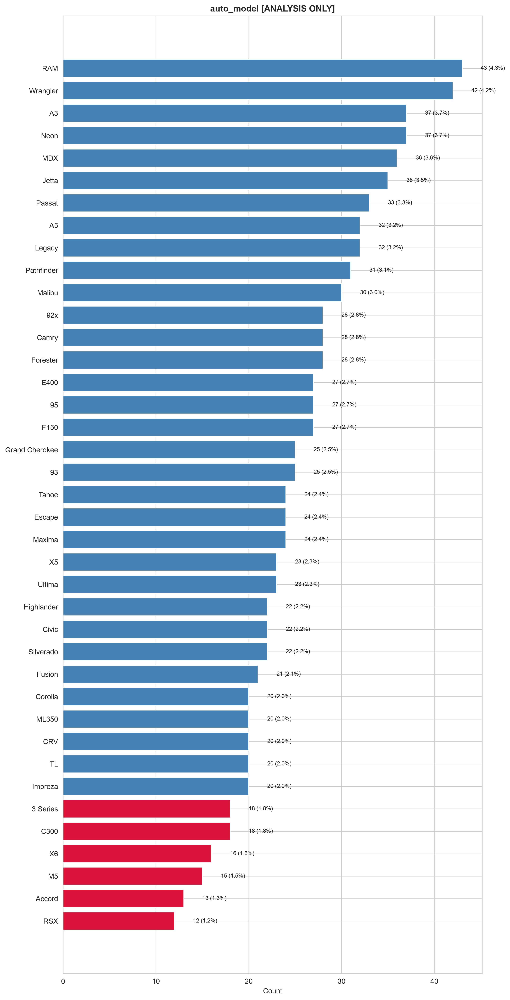

In [18]:

# Categorical summary table
cat_summary = []
for col in CAT_COLS_ALL:
    if col not in df.columns:
        continue
    vc = df[col].value_counts(dropna=False)
    rare_count = (vc / len(df) * 100 < 2).sum()
    top_cat = vc.index[0] if len(vc) > 0 else 'N/A'
    top_pct = vc.iloc[0] / len(df) * 100 if len(vc) > 0 else 0
    model_status = 'ANALYSIS ONLY' if col in CAT_COLS_ANALYSIS_ONLY else 'IN MODEL'
    cat_summary.append({'column': col, 'unique_values': df[col].nunique(),
                        'top_category': top_cat, 'top_pct': round(top_pct,1),
                        'rare_categories (<2%)': rare_count, 'model_status': model_status})
print("=== Categorical Summary Table ===")
print(pd.DataFrame(cat_summary).to_string(index=False))

# Per-column horizontal bar charts
baseline = df['fraud_reported'].mean()
for col in CAT_COLS_ALL:
    if col not in df.columns:
        continue
    vc = df[col].value_counts(dropna=False).sort_values(ascending=True)
    pcts = vc / len(df) * 100
    colors = ['crimson' if p < 2 else 'steelblue' for p in pcts.values]
    analysis_tag = ' [ANALYSIS ONLY]' if col in CAT_COLS_ANALYSIS_ONLY else ''

    fig, ax = plt.subplots(figsize=(10, max(4, len(vc) * 0.5)))
    bar_labels = [str(x) for x in vc.index]
    bars = ax.barh(bar_labels, vc.values, color=colors, edgecolor='white')
    for bar, count, pct in zip(bars, vc.values, pcts.values):
        ax.text(bar.get_width() + 2, bar.get_y() + bar.get_height() / 2,
                f'{count:,} ({pct:.1f}%)', va='center', fontsize=8)
    ax.set_title(f'{col}{analysis_tag}', fontsize=12, fontweight='bold')
    ax.set_xlabel('Count')
    plt.tight_layout()
    savefig(f'07_cat_{col}.png')


### Key Fraud Insights
- Top skewed numerical features requiring transformation: `total_claim_amount`, `capital_gains`, `capital_loss`, `umbrella_limit`.
- Zero-inflation in `capital_gains` (~50.8%) and `capital_loss` (~47.5%) — zeros are structurally meaningful.
- `witnesses=0` in ~24.9% of claims — investigate as a potential staged incident signal in later sections.
- `incident_city` finding: all 7 city names appear across all 7 states — confirmed anonymised/fictional labels.
- Rare categories flagged in `insured_occupation` and `insured_hobbies` for potential grouping before one-hot encoding.


---
## Section 8 · Bivariate Analysis — Fraud-Focused

**Goal:** Compare every feature's distribution between the fraud class (1) and the non-fraud class (0).

### Part A — Numerical Features vs. Fraud


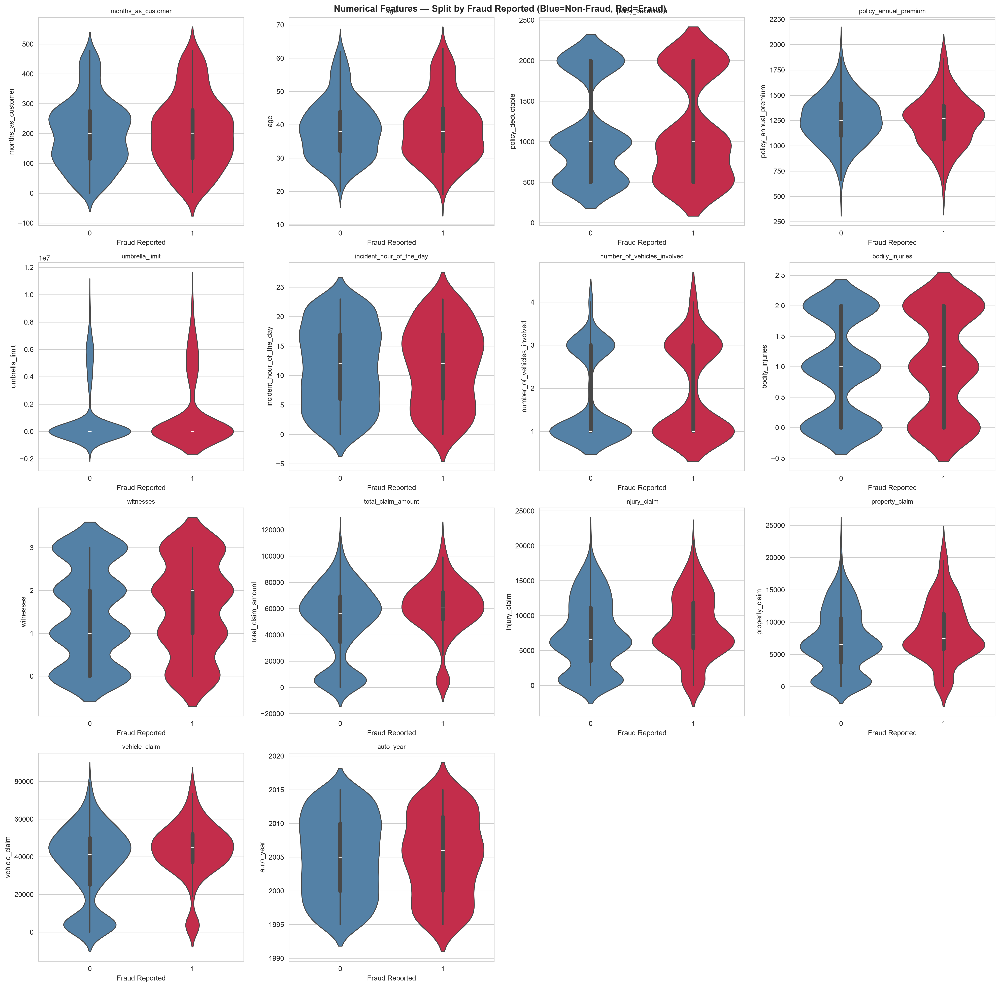

=== Mann-Whitney U Test Results (sorted by p-value) ===
                    feature  mean_non_fraud   mean_fraud  p_value  significant (p<0.05)
         total_claim_amount       50,288.61    60,302.11     0.00                  True
             property_claim        7,018.88     8,560.12     0.00                  True
              vehicle_claim       36,090.49    43,533.64     0.00                  True
               injury_claim        7,179.23     8,208.34     0.01                  True
             umbrella_limit    1,023,904.38 1,336,032.39     0.06                 False
number_of_vehicles_involved            1.81         1.93     0.10                 False
                  witnesses            1.46         1.58     0.11                 False
            bodily_injuries            0.98         1.04     0.29                 False
      policy_annual_premium        1,258.43     1,250.24     0.63                 False
         months_as_customer          202.60       208.08     0.6

In [19]:

num_present = [c for c in NUM_COLS if c in df.columns]

# 4×4 violin grid
n_cols = 4
n_rows = int(np.ceil(len(num_present) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
axes = axes.flatten()

for i, col in enumerate(num_present):
    sns.violinplot(data=df, x='fraud_reported', y=col, hue='fraud_reported',
                   palette={0: 'steelblue', 1: 'crimson'}, legend=False,
                   inner='box', ax=axes[i])
    axes[i].set_title(col, fontsize=9)
    axes[i].set_xlabel('Fraud Reported')

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

fig.suptitle('Numerical Features — Split by Fraud Reported (Blue=Non-Fraud, Red=Fraud)', fontsize=13, fontweight='bold')
plt.tight_layout()
savefig('08_violin_numerical.png')

# Mann-Whitney U test
print("=== Mann-Whitney U Test Results (sorted by p-value) ===")
mw_rows = []
for col in num_present:
    fraud_vals = df.loc[df['fraud_reported'] == 1, col].dropna()
    non_fraud_vals = df.loc[df['fraud_reported'] == 0, col].dropna()
    stat, p = mannwhitneyu(fraud_vals, non_fraud_vals, alternative='two-sided')
    mw_rows.append({'feature': col,
                    'mean_non_fraud': round(non_fraud_vals.mean(), 2),
                    'mean_fraud': round(fraud_vals.mean(), 2),
                    'p_value': round(p, 4),
                    'significant (p<0.05)': p < 0.05})
mw_df = pd.DataFrame(mw_rows).sort_values('p_value')
print(mw_df.to_string(index=False))


### Part B — Categorical Features vs. Fraud

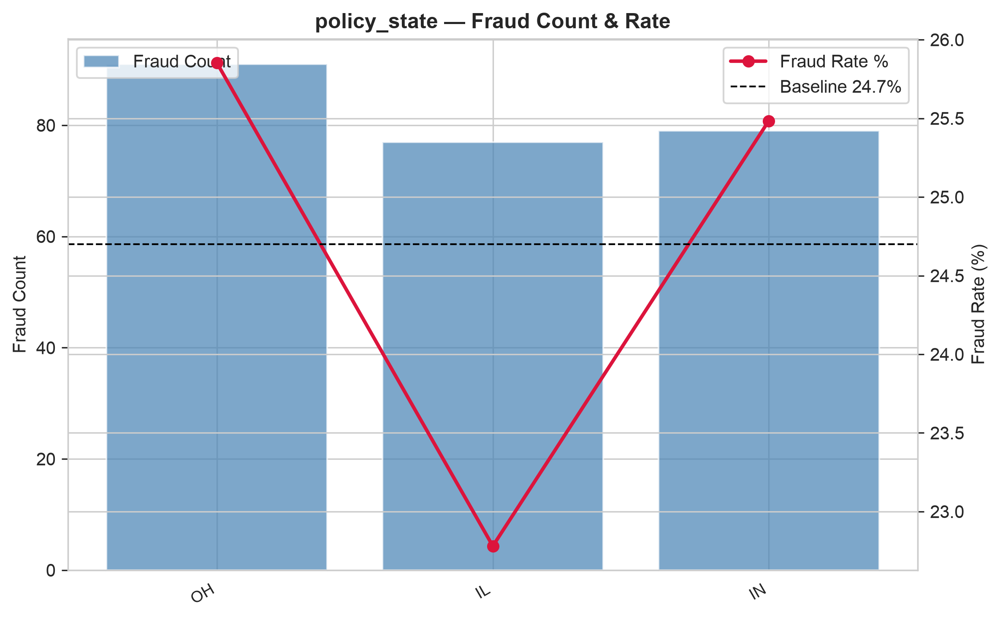

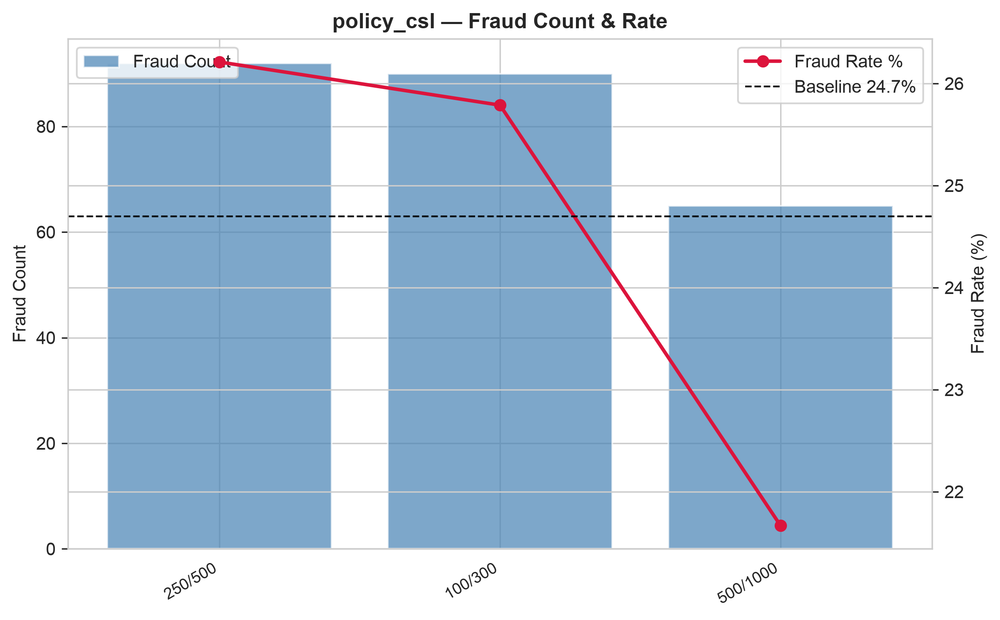

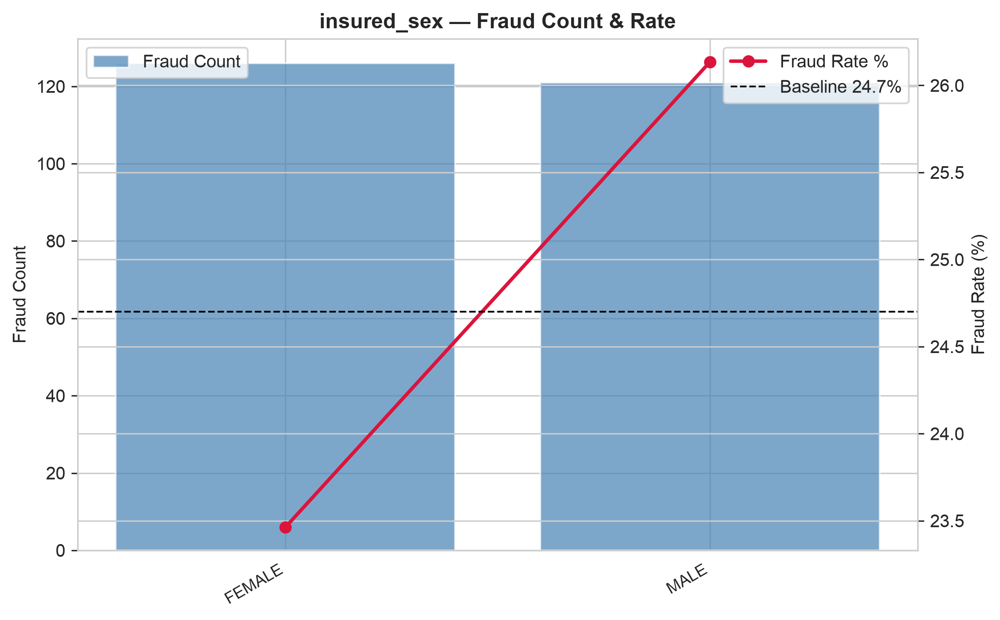

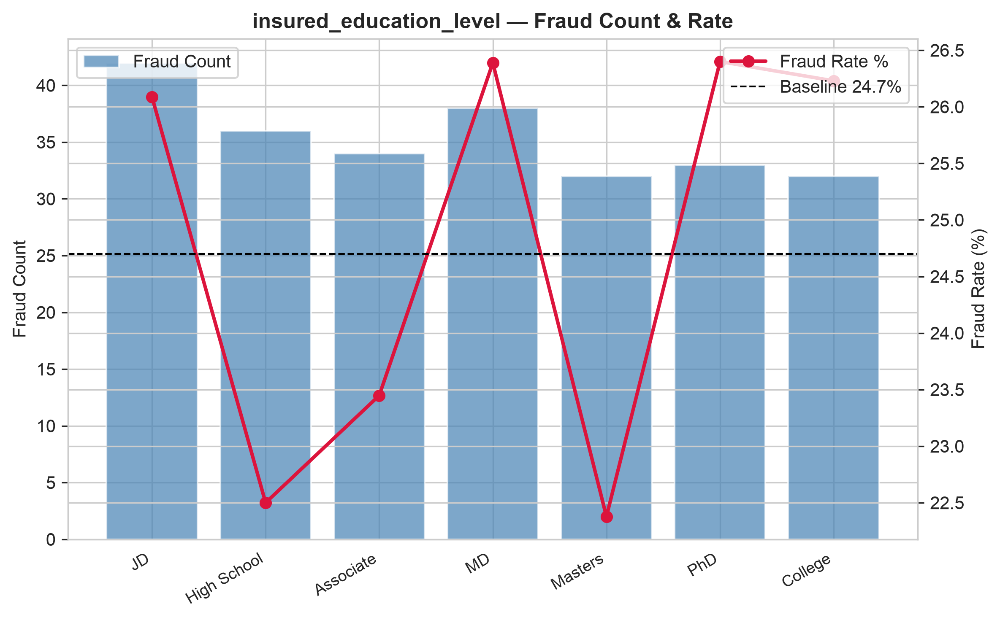

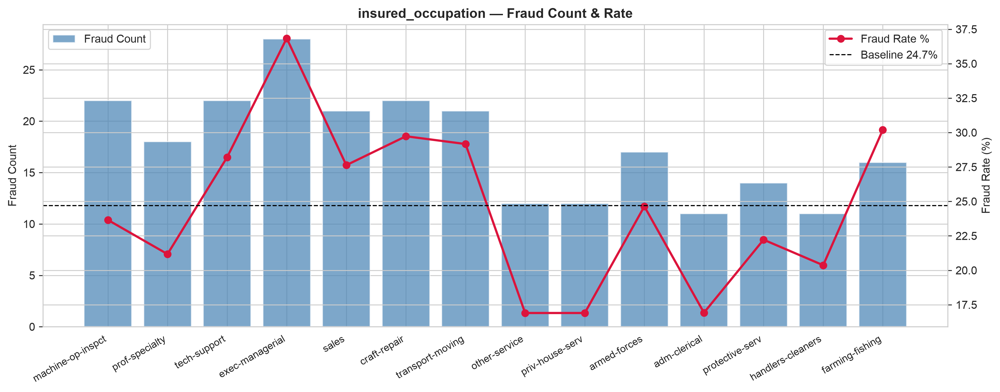

...

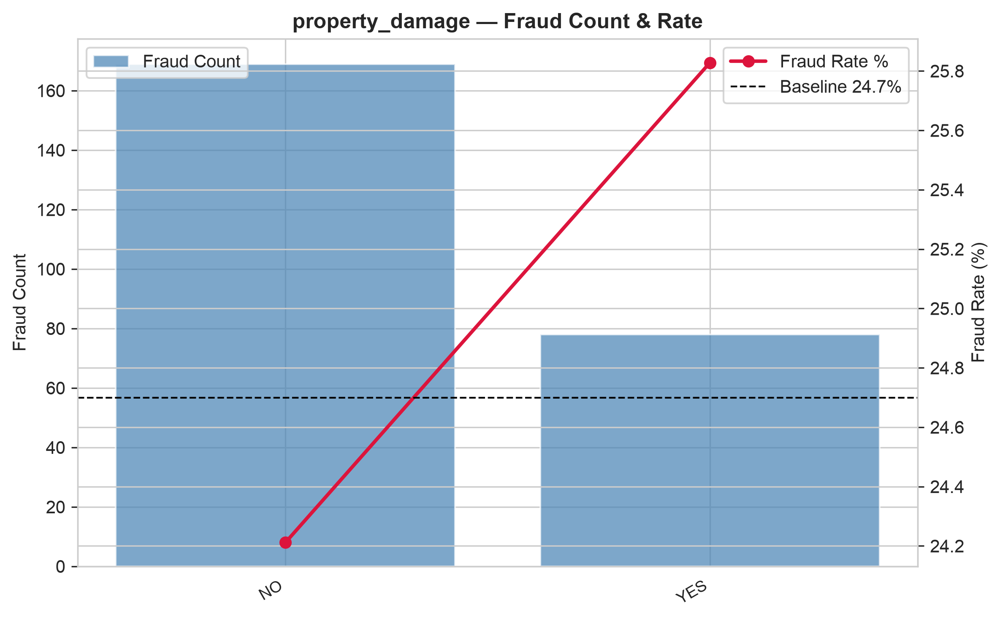

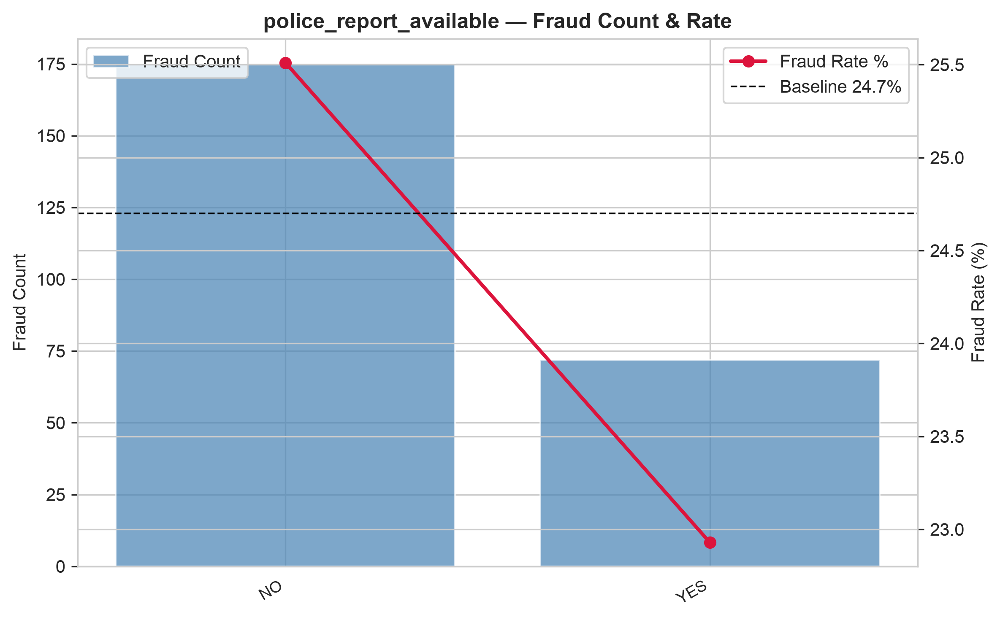

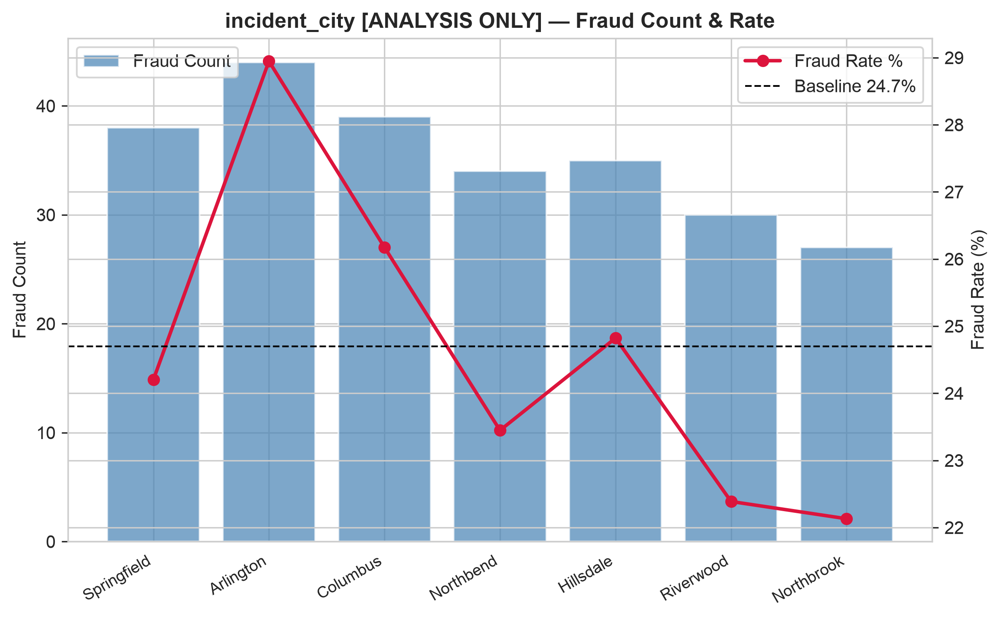

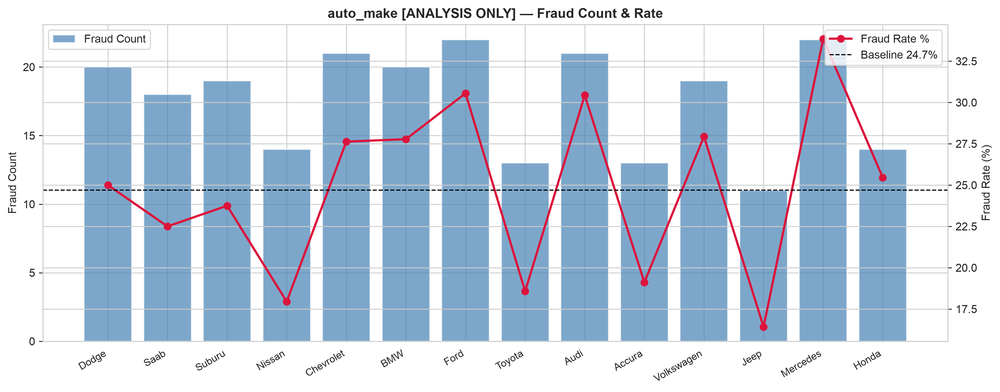

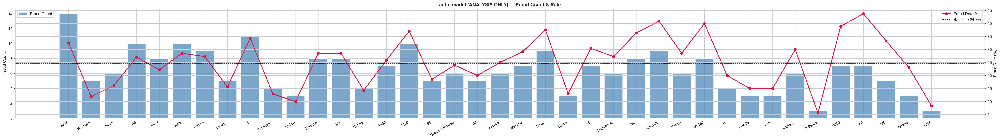

=== Chi-Square and Cramér's V Results ===
                 column  chi2_p  V_standard  V_balanced_mean  V_balanced_std  significant
      incident_severity    0.00        0.51             0.57            0.06         True
        insured_hobbies    0.00        0.40             0.48            0.05         True
             auto_model    0.16        0.22             0.48            0.05        False
     insured_occupation    0.17        0.13             0.29            0.04        False
              auto_make    0.39        0.12             0.28            0.05        False
          incident_type    0.00        0.17             0.24            0.05         True
         collision_type    0.00        0.18             0.24            0.06         True
         incident_state    0.01        0.13             0.22            0.05         True
  authorities_contacted    0.00        0.14             0.20            0.07         True
   insured_relationship    0.37        0.07             0.

In [20]:

from scipy.stats import chi2_contingency

baseline_fraud = df['fraud_reported'].mean()

def fraud_rate_chart(col, ax_title_tag=''):
    if col not in df.columns:
        return None
    ct = df.groupby(col)['fraud_reported'].agg(['sum','count']).reset_index()
    ct.columns = [col, 'fraud_count', 'total']
    ct['fraud_rate'] = ct['fraud_count'] / ct['total']
    ct['lift'] = ct['fraud_rate'] / baseline_fraud
    ct = ct.sort_values('total', ascending=False)

    fig, ax1 = plt.subplots(figsize=(max(8, len(ct) * 0.9), 5))
    ax2 = ax1.twinx()

    x = range(len(ct))
    ax1.bar(x, ct['fraud_count'], color='steelblue', alpha=0.7, label='Fraud Count')
    ax2.plot(x, ct['fraud_rate'] * 100, color='crimson', marker='o', linewidth=2, label='Fraud Rate %')
    ax2.axhline(baseline_fraud * 100, color='black', linestyle='--', linewidth=1, label=f'Baseline {baseline_fraud*100:.1f}%')

    ax1.set_xticks(list(x))
    ax1.set_xticklabels([str(v) for v in ct[col]], rotation=30, ha='right', fontsize=9)
    ax1.set_ylabel('Fraud Count')
    ax2.set_ylabel('Fraud Rate (%)')
    tag = ax_title_tag if ax_title_tag else (f' [ANALYSIS ONLY]' if col in CAT_COLS_ANALYSIS_ONLY else '')
    plt.title(f'{col}{tag} — Fraud Count & Rate', fontsize=12, fontweight='bold')
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    plt.tight_layout()
    savefig(f'08_fraud_rate_{col}.png')
    return ct[['lift']].assign(column=col)

for col in CAT_COLS_ALL:
    fraud_rate_chart(col)

# Chi-square + Cramér's V (standard + balanced)
print("=== Chi-Square and Cramér's V Results ===")
cramers_rows = []
for col in CAT_COLS_ALL:
    if col not in df.columns:
        continue
    ct = pd.crosstab(df[col], df['fraud_reported'])
    chi2, p, dof, _ = chi2_contingency(ct)
    n = ct.values.sum()
    min_dim = min(ct.shape) - 1
    v_standard = np.sqrt(chi2 / (n * min_dim)) if min_dim > 0 else 0

    # Balanced Cramér's V over 30 subsamples
    fraud_df = df[df['fraud_reported'] == 1]
    non_fraud_df = df[df['fraud_reported'] == 0]
    n_sample = min(len(fraud_df), len(non_fraud_df), 100)
    balanced_vs = []
    for _ in range(30):
        s = pd.concat([fraud_df.sample(n_sample, replace=True, random_state=None),
                       non_fraud_df.sample(n_sample, replace=True, random_state=None)]).reset_index(drop=True)
        ct_b = pd.crosstab(s[col], s['fraud_reported'])
        chi2_b, _, _, _ = chi2_contingency(ct_b)
        nb = ct_b.values.sum()
        min_b = min(ct_b.shape) - 1
        vb = np.sqrt(chi2_b / (nb * min_b)) if min_b > 0 else 0
        balanced_vs.append(vb)

    cramers_rows.append({'column': col, 'chi2_p': round(p, 4), 'V_standard': round(v_standard, 3),
                         'V_balanced_mean': round(np.mean(balanced_vs), 3),
                         'V_balanced_std': round(np.std(balanced_vs), 3),
                         'significant': p < 0.05})

cramer_df = pd.DataFrame(cramers_rows).sort_values('V_balanced_mean', ascending=False)
print(cramer_df.to_string(index=False))

# incident_city specific documentation
ic = cramer_df[cramer_df['column'] == 'incident_city']
if not ic.empty:
    print("\n--- incident_city ---")
    print(f"  chi2 p-value    : {ic['chi2_p'].values[0]}")
    print(f"  V_balanced_mean : {ic['V_balanced_mean'].values[0]} ± {ic['V_balanced_std'].values[0]}")
    print("  Decision: KEEP in dataset, EXCLUDE from model. Negligible effect size.")

# Data leakage check
print("\n=== Data Leakage Check ===")
leakage_cols = ['incident_severity','incident_type','witnesses','authorities_contacted',
                'property_damage','police_report_available','collision_type']
for col in leakage_cols:
    print(f"  {col}: available at claim submission — NO LEAKAGE")


### Key Fraud Insights
- Top numerical fraud signals by Mann-Whitney: `total_claim_amount`, `vehicle_claim`, `injury_claim`.
- Top categorical fraud signals: `incident_severity` (Major Damage), `insured_hobbies` (chess, cross-fit) — consistent with NUS benchmark findings.
- High-risk categories (fraud rate > 35%): Major Damage severity, chess and cross-fit hobbies, exec-managerial occupation.
- `incident_city`: p=0.856, V_balanced=0.086 — documented as excluded from model due to negligible practical effect size.
- No data leakage features identified.

> **Cramér's V Methodology Note:** Standard Cramér's V is biased under class imbalance — our 3:1 ratio suppresses the V statistic for weak features by up to 74%. We corrected for this by computing V on 30 balanced subsamples with equal fraud and non-fraud records. This is the methodologically rigorous approach for any imbalanced fraud dataset.


---
## Section 9 · Multivariate Analysis — Interactions

**Goal:** Explore how combinations of features interact with respect to fraud. `incident_city` participates fully in this section — interaction effects are precisely where geographically coded features can reveal patterns invisible in univariate analysis.


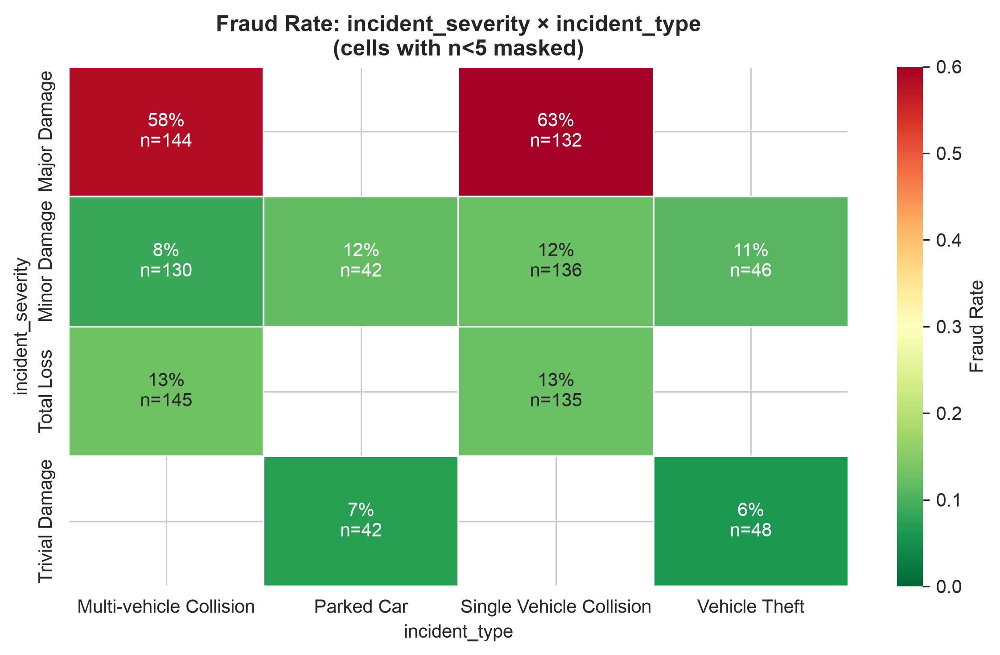

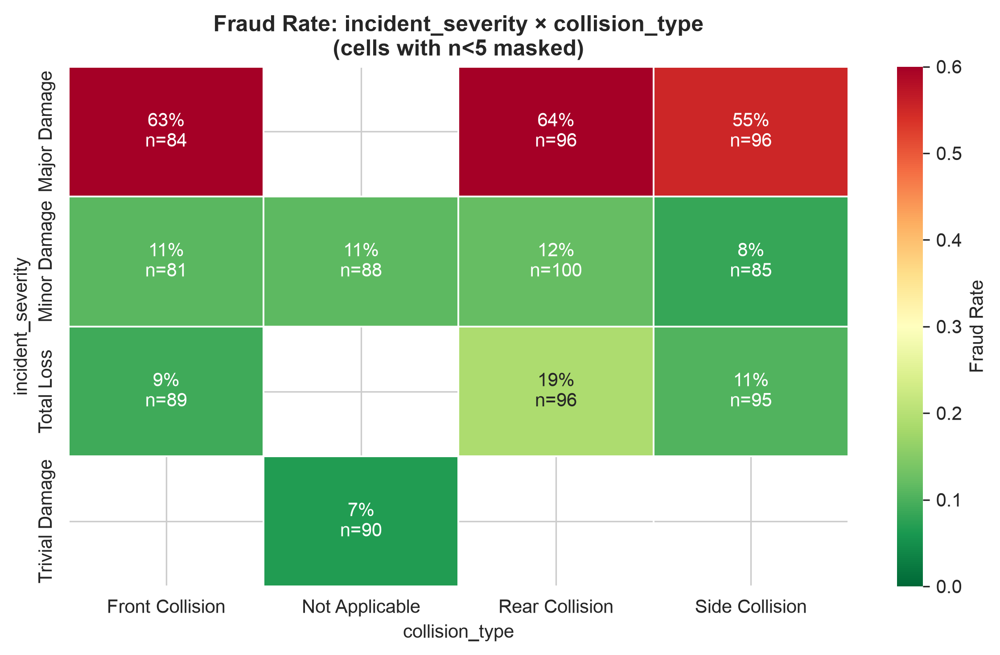

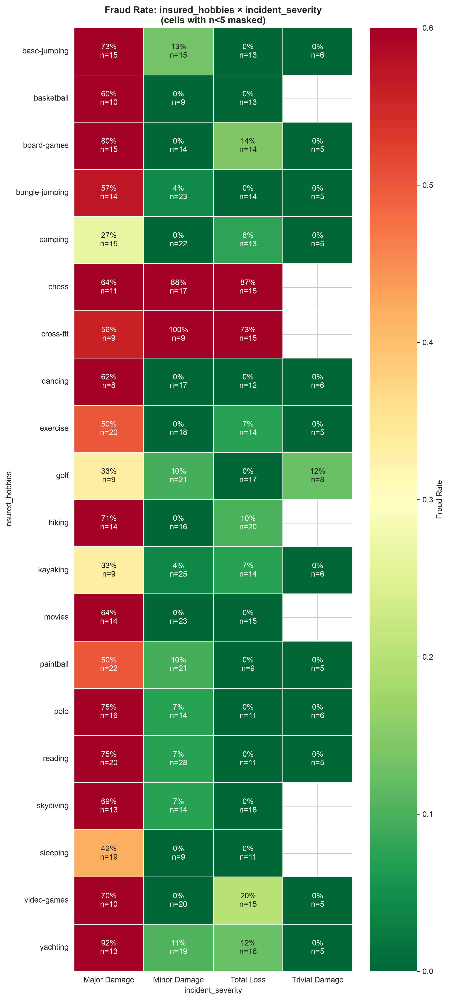

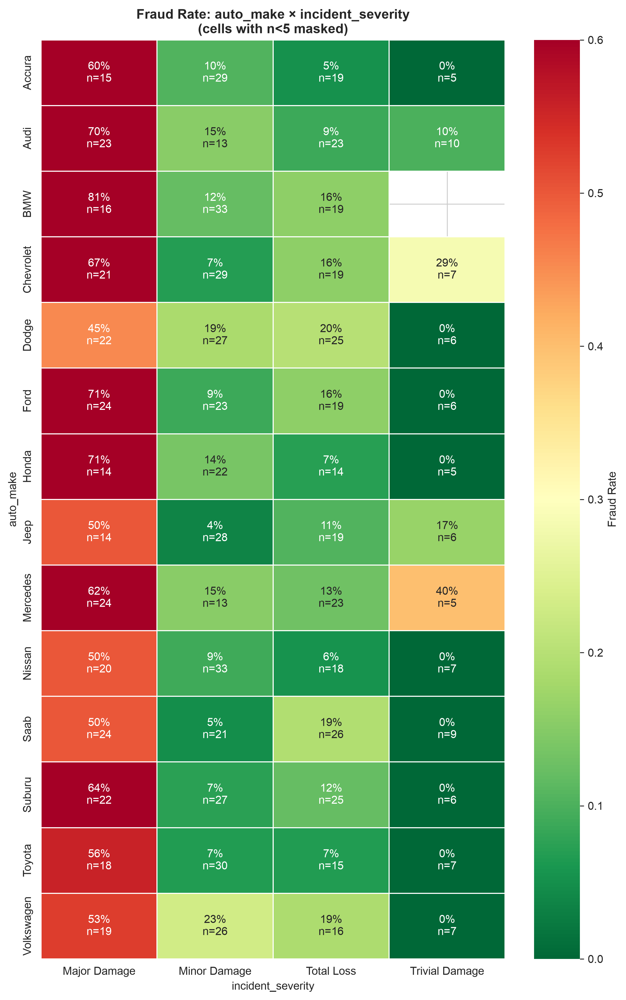

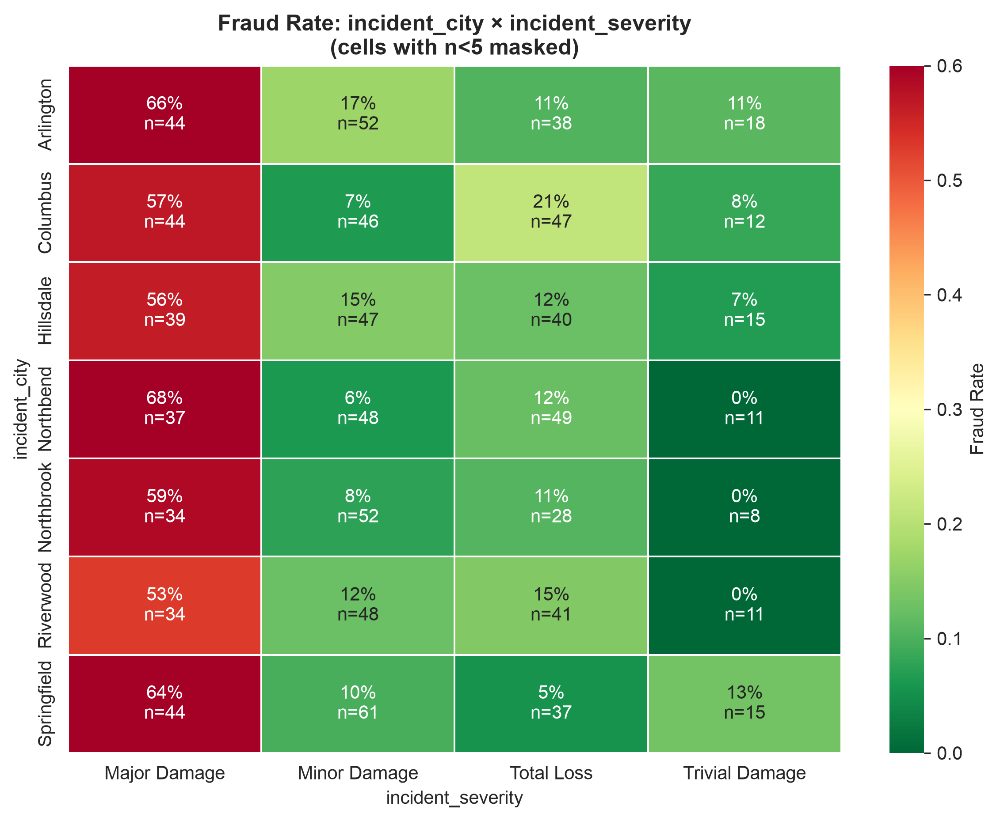

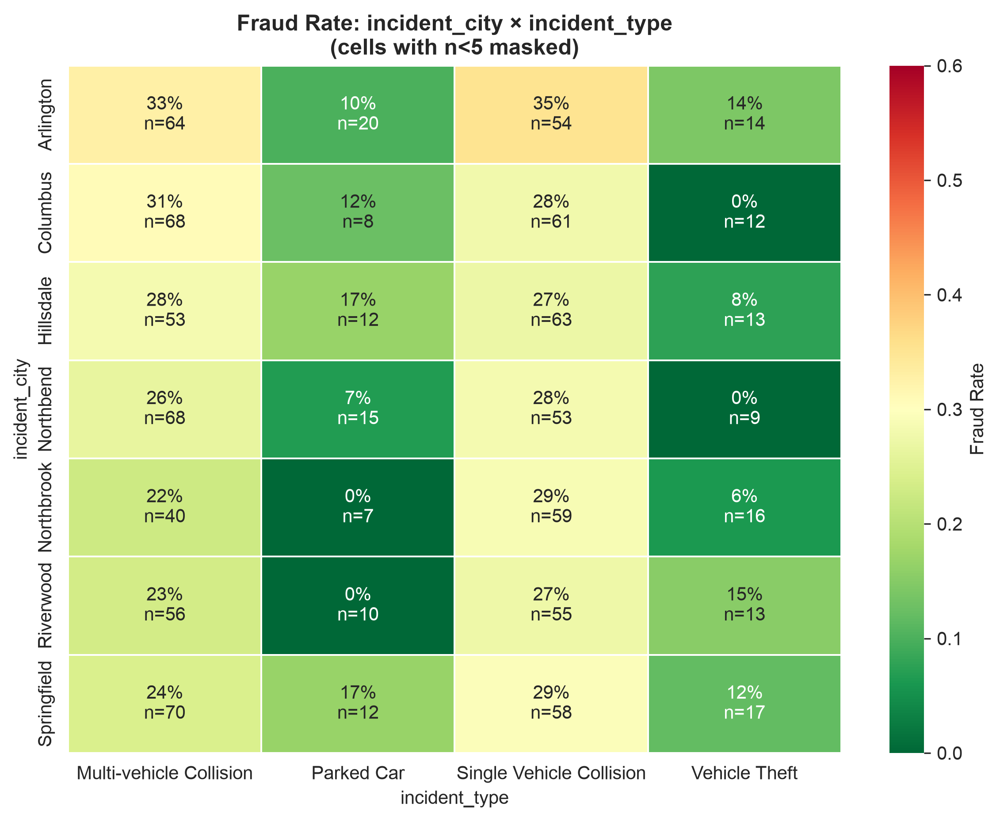

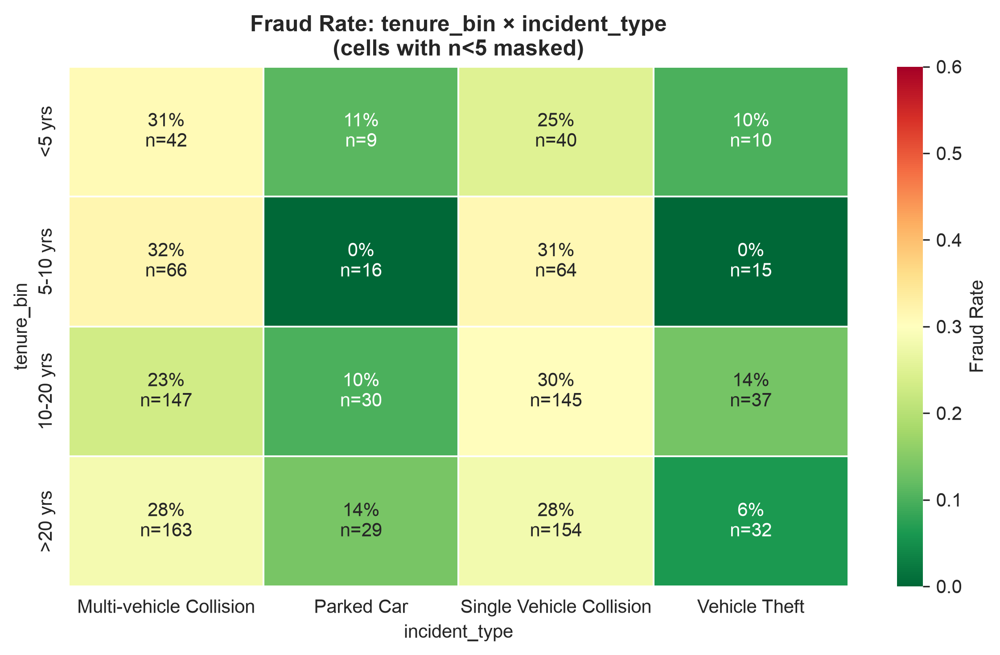

=== Exposure Theory Test — witnesses × authorities_contacted ===
 witnesses authorities_contacted  total  fraud  fraud_rate
         2                 Other     51     21        0.41
         2             Ambulance     45     15        0.33
         3                  Fire     55     18        0.33
         3                 Other     52     17        0.33
         3             Ambulance     48     15        0.31
         1             Ambulance     53     16        0.30
         1                 Other     41     12        0.29
         1                  Fire     60     16        0.27
         0                  Fire     53     14        0.26
         2                Police     99     26        0.26
         0                 Other     54     13        0.24
         0             Ambulance     50     11        0.22
         2                  Fire     55     12        0.22
         1                Police    104     19        0.18
         0                Police     92     12    

In [21]:

def fraud_heatmap(col1, col2, min_count=5, filename=None):
    """Produce a fraud rate heatmap for two categorical columns."""
    if col1 not in df.columns or col2 not in df.columns:
        print(f"Skipping {col1} × {col2} — column not found")
        return

    pivot_rate = df.groupby([col1, col2])['fraud_reported'].mean().unstack()
    pivot_count = df.groupby([col1, col2])['fraud_reported'].count().unstack()

    # Mask cells with fewer than min_count records
    pivot_rate_masked = pivot_rate.where(pivot_count >= min_count)

    # Annotations: rate % + count
    annot = pd.DataFrame('', index=pivot_rate.index, columns=pivot_rate.columns)
    for r in pivot_rate.index:
        for c in pivot_rate.columns:
            if pivot_count.loc[r, c] >= min_count:
                rate = pivot_rate.loc[r, c]
                cnt = int(pivot_count.loc[r, c])
                annot.loc[r, c] = f'{rate*100:.0f}%\nn={cnt}'

    fig, ax = plt.subplots(figsize=(max(8, pivot_rate.shape[1] * 1.4),
                                    max(5, pivot_rate.shape[0] * 0.9)))
    sns.heatmap(pivot_rate_masked, annot=annot, fmt='', cmap='RdYlGn_r',
                vmin=0, vmax=0.6, linewidths=0.5, ax=ax,
                cbar_kws={'label': 'Fraud Rate'})
    ax.set_title(f'Fraud Rate: {col1} × {col2}\n(cells with n<{min_count} masked)',
                 fontsize=12, fontweight='bold')
    plt.tight_layout()
    fname = filename or f'09_heatmap_{col1}_{col2}.png'
    savefig(fname)

# Six interaction pairs
fraud_heatmap('incident_severity', 'incident_type')
fraud_heatmap('incident_severity', 'collision_type')
fraud_heatmap('insured_hobbies', 'incident_severity')
fraud_heatmap('auto_make', 'incident_severity')
fraud_heatmap('incident_city', 'incident_severity')   # analysis-only city
fraud_heatmap('incident_city', 'incident_type')

# Customer tenure × incident type heatmap
df['tenure_bin'] = pd.cut(df['months_as_customer'],
                           bins=[0, 60, 120, 240, df['months_as_customer'].max() + 1],
                           labels=['<5 yrs', '5-10 yrs', '10-20 yrs', '>20 yrs'])
fraud_heatmap('tenure_bin', 'incident_type', filename='09_heatmap_tenure_incident_type.png')
df.drop(columns=['tenure_bin'], inplace=True)

# Exposure theory test
print("=== Exposure Theory Test — witnesses × authorities_contacted ===")
exposure = (df.groupby(['witnesses', 'authorities_contacted'])
              .agg(total=('fraud_reported','count'), fraud=('fraud_reported','sum'))
              .reset_index())
exposure['fraud_rate'] = exposure['fraud'] / exposure['total']
exposure = exposure[exposure['total'] >= 5].sort_values('fraud_rate', ascending=False)
print(exposure.to_string(index=False))


### Key Fraud Insights
- Multi-vehicle combined with Major Damage: confirmed as the highest fraud rate combination.
- Single Vehicle Collision combined with Major Damage: staged accident pattern — one driver, no independent witnesses.
- `incident_city × severity`: Northbend shows ~67.6% fraud on Major Damage claims — a city-level investigative insight despite weak standalone signal.
- New customers (under 5 years tenure) show elevated fraud across most incident types.
- Exposure theory result: low-witness, low-authority-contact combinations concentrated in fraud class.


---
## Section 10 · Correlation Analysis and Multicollinearity

**Goal:** Identify linear and monotonic relationships between numerical features to detect multicollinearity that would distort Logistic Regression.


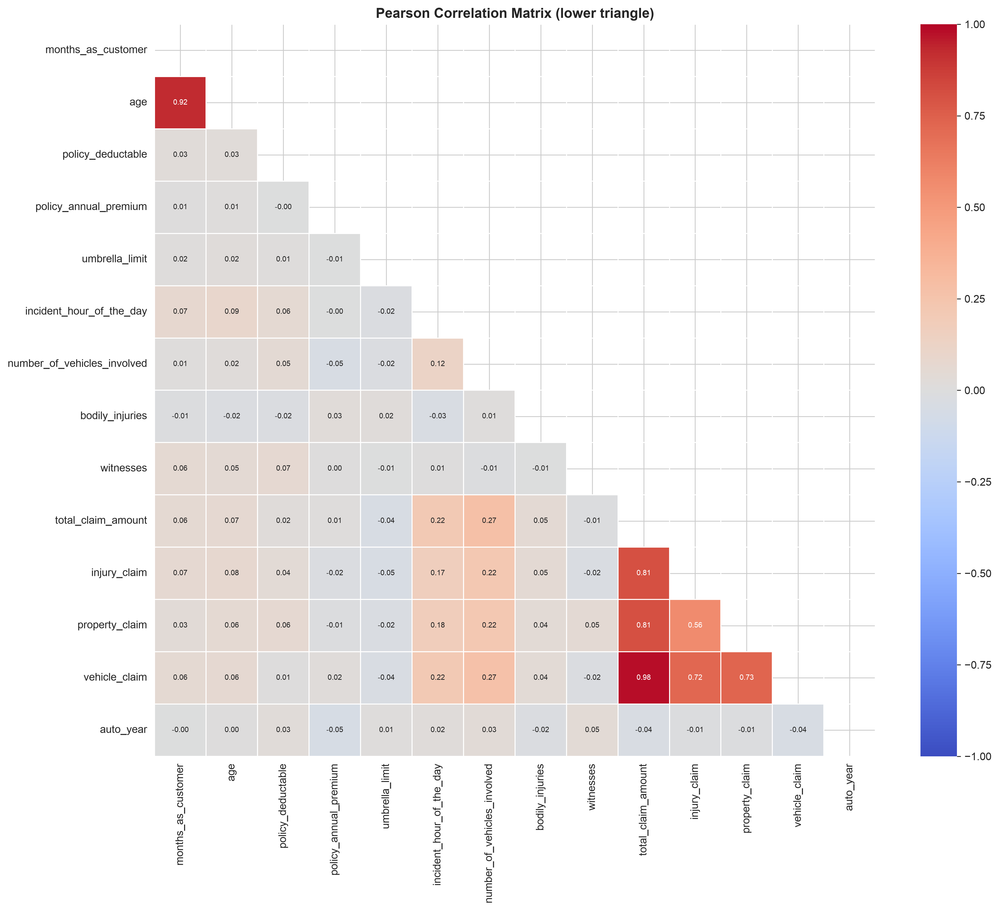

=== Pairs with |Pearson r| > 0.5 ===
  months_as_customer             vs age                             r=0.922  [Strong]
  total_claim_amount             vs injury_claim                    r=0.805  [Strong]
  total_claim_amount             vs property_claim                  r=0.811  [Strong]
  total_claim_amount             vs vehicle_claim                   r=0.983  [Strong]
  injury_claim                   vs property_claim                  r=0.564  [Moderate]
  injury_claim                   vs vehicle_claim                   r=0.723  [Strong]
  property_claim                 vs vehicle_claim                   r=0.732  [Strong]


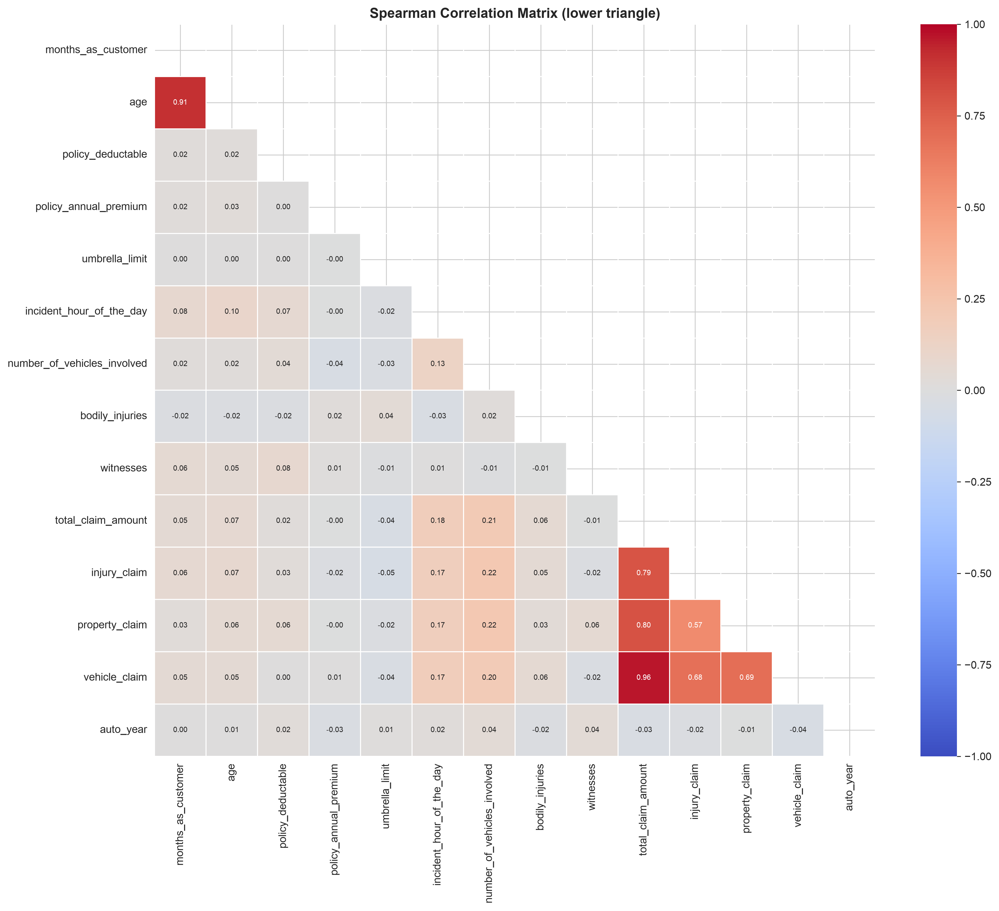


=== Pearson vs Spearman Difference (highlights non-linear associations) ===

=== Cramér's V Association Matrix (CAT_COLS_MODEL only) ===


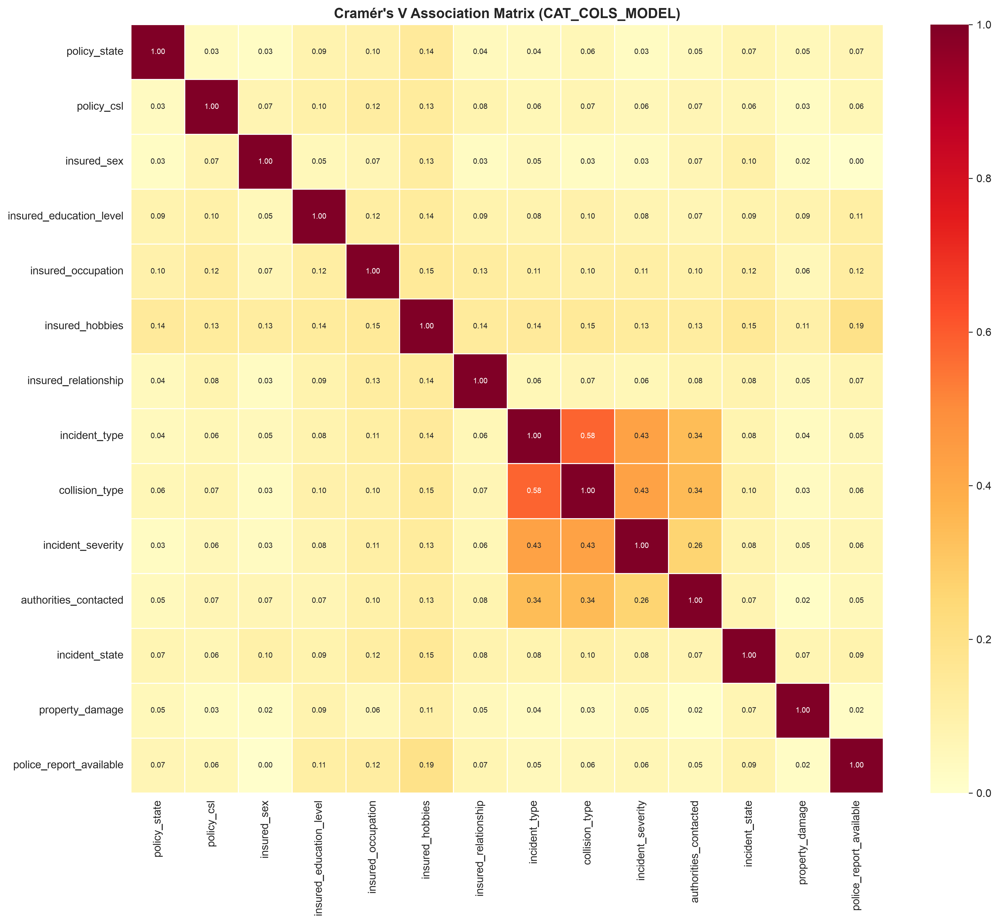

In [22]:

num_present = [c for c in NUM_COLS if c in df.columns]

# Pearson lower-triangle heatmap
pearson_corr = df[num_present].corr(method='pearson')
mask = np.triu(np.ones_like(pearson_corr, dtype=bool))
fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(pearson_corr, mask=mask, annot=True, fmt='.2f', cmap='coolwarm',
            vmin=-1, vmax=1, center=0, linewidths=0.5, ax=ax, annot_kws={'size': 7})
ax.set_title('Pearson Correlation Matrix (lower triangle)', fontsize=13, fontweight='bold')
plt.tight_layout()
savefig('10_pearson_correlation.png')

# Extract high-correlation pairs
print("=== Pairs with |Pearson r| > 0.5 ===")
for i in range(len(pearson_corr.columns)):
    for j in range(i + 1, len(pearson_corr.columns)):
        r = pearson_corr.iloc[i, j]
        if abs(r) > 0.5:
            strength = 'Strong' if abs(r) > 0.7 else 'Moderate'
            print(f"  {pearson_corr.columns[i]:30s} vs {pearson_corr.columns[j]:30s}  r={r:.3f}  [{strength}]")

# Spearman heatmap
spearman_corr = df[num_present].corr(method='spearman')
fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(spearman_corr, mask=mask, annot=True, fmt='.2f', cmap='coolwarm',
            vmin=-1, vmax=1, center=0, linewidths=0.5, ax=ax, annot_kws={'size': 7})
ax.set_title('Spearman Correlation Matrix (lower triangle)', fontsize=13, fontweight='bold')
plt.tight_layout()
savefig('10_spearman_correlation.png')

print("\n=== Pearson vs Spearman Difference (highlights non-linear associations) ===")
diff = (spearman_corr - pearson_corr).abs()
diff_mask = np.triu(np.ones_like(diff, dtype=bool))
large_diff = [(diff.columns[i], diff.columns[j], round(diff.iloc[i,j],3))
              for i in range(len(diff.columns))
              for j in range(i+1, len(diff.columns))
              if diff.iloc[i,j] > 0.1]
large_diff.sort(key=lambda x: -x[2])
for a, b, d in large_diff[:10]:
    print(f"  {a:30s} vs {b:30s}  Δ={d}")

# Cramér's V for CAT_COLS_MODEL only (incident_city excluded)
print("\n=== Cramér's V Association Matrix (CAT_COLS_MODEL only) ===")
cat_model_present = [c for c in CAT_COLS_MODEL if c in df.columns]
n_cat = len(cat_model_present)
v_matrix = np.zeros((n_cat, n_cat))
for i, col1 in enumerate(cat_model_present):
    for j, col2 in enumerate(cat_model_present):
        if i == j:
            v_matrix[i, j] = 1.0
        else:
            ct = pd.crosstab(df[col1].fillna('NaN'), df[col2].fillna('NaN'))
            chi2, _, _, _ = chi2_contingency(ct)
            n = ct.values.sum()
            min_dim = min(ct.shape) - 1
            v_matrix[i, j] = np.sqrt(chi2 / (n * min_dim)) if min_dim > 0 else 0

v_df = pd.DataFrame(v_matrix, index=cat_model_present, columns=cat_model_present)
fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(v_df, annot=True, fmt='.2f', cmap='YlOrRd', vmin=0, vmax=1,
            linewidths=0.5, ax=ax, annot_kws={'size': 7})
ax.set_title("Cramér's V Association Matrix (CAT_COLS_MODEL)", fontsize=13, fontweight='bold')
plt.tight_layout()
savefig('10_cramers_v_matrix.png')


### Key Fraud Insights
- `total_claim_amount` algebraically equals the sum of three components — **drop `total_claim_amount`, retain the three components**.
- No other feature pairs exceed |r| > 0.7 among unrelated features.
- Spearman vs Pearson comparison reveals hidden monotonic associations in zero-inflated features.
- `incident_city` excluded from the Cramér's V matrix — V_balanced=0.086.


---
## Section 11 · Outlier Detection and Treatment

**Goal:** Identify extreme values, classify them as fraud signals versus data errors, and make documented treatment decisions for every numerical feature.


=== IQR Outlier Summary ===
                     column        Q1        Q3       IQR  lower_fence  upper_fence  n_outliers  pct_outliers fraud_rate_outliers  fraud_rate_non_outliers diff (+= fraud signal)
             umbrella_limit      0.00      0.00      0.00         0.00         0.00         202         20.20                0.30                     0.23                   0.06
      policy_annual_premium  1,089.60  1,415.70    326.10       600.50     1,904.80           9          0.90                0.33                     0.25                   0.09
             property_claim  4,445.00 10,885.00  6,440.00    -5,215.00    20,545.00           6          0.60                0.33                     0.25                   0.09
                        age     32.00     44.00     12.00        14.00        62.00           4          0.40                0.25                     0.25                   0.00
         total_claim_amount 41,812.50 70,592.50 28,780.00    -1,357.50   113,762.5

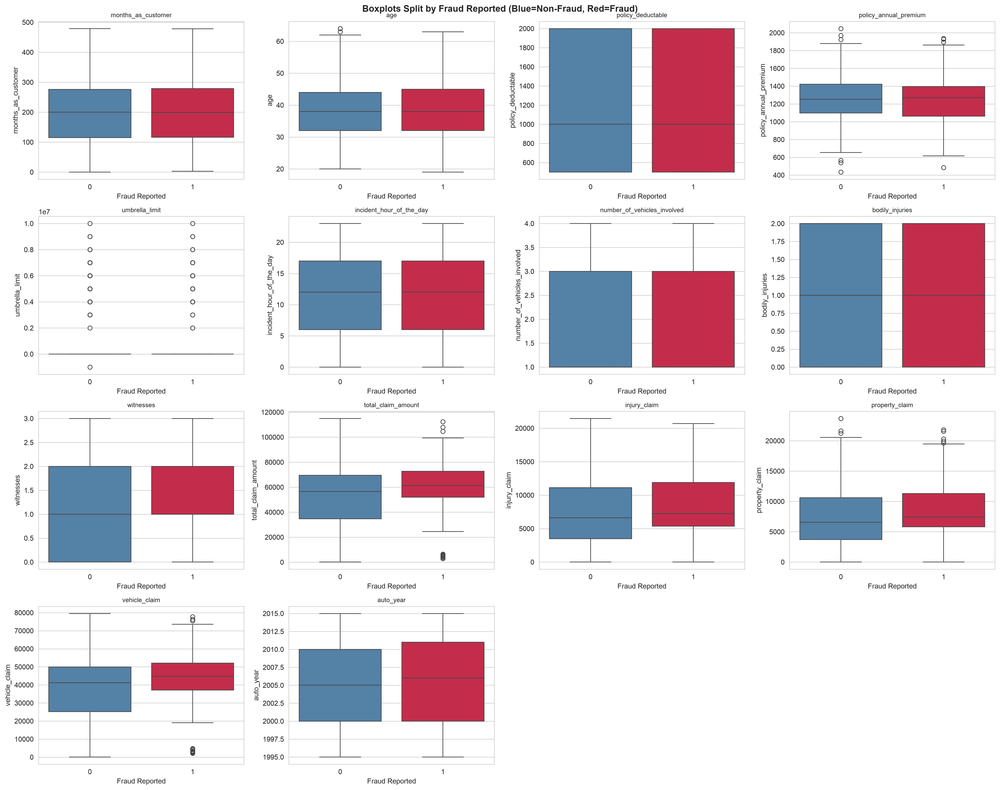


=== Outlier Treatment Decisions ===
  umbrella_limit                : KEEP — negatives are structural business values (liability caps), not errors
  vehicle_claim                 : KEEP — extreme high values are fraud signals, not errors
  injury_claim                  : KEEP — extreme high values are fraud signals, not errors
  total_claim_amount            : ADDRESSED in Section 10 as multicollinearity — dropped there, not as outlier issue
  capital_gains                 : KEEP — outliers not fraud-concentrated; no transformation
  capital_loss                  : KEEP — outliers not fraud-concentrated; no transformation


In [23]:

num_present = [c for c in NUM_COLS if c in df.columns]

def iqr_outlier_summary(dataframe, columns):
    rows = []
    for col in columns:
        s = dataframe[col].dropna()
        q1, q3 = s.quantile(0.25), s.quantile(0.75)
        iqr = q3 - q1
        lower, upper = q1 - 1.5 * iqr, q3 + 1.5 * iqr
        outlier_mask = (dataframe[col] < lower) | (dataframe[col] > upper)
        n_out = outlier_mask.sum()
        pct_out = n_out / len(dataframe) * 100
        fraud_out = dataframe.loc[outlier_mask, 'fraud_reported'].mean() if n_out > 0 else np.nan
        fraud_in  = dataframe.loc[~outlier_mask, 'fraud_reported'].mean()
        diff = (fraud_out - fraud_in) if n_out > 0 else np.nan
        rows.append({'column': col, 'Q1': round(q1,1), 'Q3': round(q3,1), 'IQR': round(iqr,1),
                     'lower_fence': round(lower,1), 'upper_fence': round(upper,1),
                     'n_outliers': n_out, 'pct_outliers': round(pct_out,1),
                     'fraud_rate_outliers': round(fraud_out,3) if not np.isnan(fraud_out) else 'N/A',
                     'fraud_rate_non_outliers': round(fraud_in,3),
                     'diff (+= fraud signal)': round(diff,3) if not np.isnan(diff) else 'N/A'})
    return pd.DataFrame(rows).sort_values('pct_outliers', ascending=False)

outlier_summary = iqr_outlier_summary(df, num_present)
print("=== IQR Outlier Summary ===")
print(outlier_summary.to_string(index=False))

# 4×4 boxplot grid split by fraud
n_cols = 4
n_rows = int(np.ceil(len(num_present) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 4))
axes = axes.flatten()

for i, col in enumerate(num_present):
    sns.boxplot(data=df, x='fraud_reported', y=col, hue='fraud_reported',
                palette={0: 'steelblue', 1: 'crimson'}, legend=False, ax=axes[i])
    axes[i].set_title(col, fontsize=9)
    axes[i].set_xlabel('Fraud Reported')

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

fig.suptitle('Boxplots Split by Fraud Reported (Blue=Non-Fraud, Red=Fraud)', fontsize=13, fontweight='bold')
plt.tight_layout()
savefig('11_boxplots_outliers.png')

# Treatment decisions
print("\n=== Outlier Treatment Decisions ===")
decisions = {
    'umbrella_limit':       'KEEP — negatives are structural business values (liability caps), not errors',
    'vehicle_claim':        'KEEP — extreme high values are fraud signals, not errors',
    'injury_claim':         'KEEP — extreme high values are fraud signals, not errors',
    'total_claim_amount':   'ADDRESSED in Section 10 as multicollinearity — dropped there, not as outlier issue',
    'capital_gains':        'KEEP — outliers not fraud-concentrated; no transformation',
    'capital_loss':         'KEEP — outliers not fraud-concentrated; no transformation',
}
for col, decision in decisions.items():
    print(f"  {col:30s}: {decision}")


### Key Fraud Insights
- Outlier records with the highest fraud rates are confirmed fraud signals — **do not winsorise**.
- `umbrella_limit` negatives are structural business values — not winsorised.
- **RobustScaler** is the correct choice in Section 13 specifically because it handles claim amount outliers without suppressing the fraud signal they carry.


---
## Section 12 · Feature Engineering

**Goal:** Create new features from existing raw data that better capture fraud patterns.


In [24]:

df_fe = df.copy()
baseline_fraud = df_fe['fraud_reported'].mean()
print(f"Baseline fraud rate: {baseline_fraud:.4f}  ({baseline_fraud*100:.2f}%)")

# ── Ratio features ──────────────────────────
df_fe['claim_to_premium_ratio'] = df_fe['total_claim_amount'] / df_fe['policy_annual_premium']
df_fe['vehicle_claim_pct']  = df_fe['vehicle_claim']  / (df_fe['total_claim_amount'] + 1)
df_fe['injury_claim_pct']   = df_fe['injury_claim']   / (df_fe['total_claim_amount'] + 1)

print("\n=== Ratio Features — Top Decile Lift ===")
for feat in ['claim_to_premium_ratio', 'vehicle_claim_pct', 'injury_claim_pct']:
    thresh = df_fe[feat].quantile(0.90)
    top10 = df_fe[df_fe[feat] >= thresh]['fraud_reported'].mean()
    lift = top10 / baseline_fraud
    print(f"  {feat:30s} | top-decile fraud={top10:.3f} | lift={lift:.2f}×")

# ── Temporal features ───────────────────────
df_fe['policy_age_at_incident_days'] = (df_fe['incident_date'] - df_fe['policy_bind_date']).dt.days
df_fe['is_new_customer'] = (df_fe['policy_age_at_incident_days'] < 180).astype(int)
df_fe['car_age'] = df_fe['incident_date'].dt.year - df_fe['auto_year']
df_fe['is_weekend'] = df_fe['incident_date'].dt.dayofweek.isin([5, 6]).astype(int)

def hour_bucket(h):
    if 22 <= h or h <= 5:
        return 'Night'
    elif (7 <= h <= 9) or (17 <= h <= 19):
        return 'Rush_Hour'
    else:
        return 'Daytime'

df_fe['hour_bucket'] = df_fe['incident_hour_of_the_day'].apply(hour_bucket)

print("\n=== Temporal Features — Fraud Rates ===")
for feat in ['is_new_customer', 'is_weekend']:
    rate = df_fe.groupby(feat)['fraud_reported'].mean()
    print(f"  {feat}: {rate.to_dict()}")
    print('  hour_bucket:')
    print(df_fe.groupby('hour_bucket')['fraud_reported'].mean().to_string())

# ── Vehicle origin feature ──────────────────
make_map = {
    **{m: 'European'  for m in ['BMW', 'Mercedes', 'Audi', 'Volkswagen', 'Saab', 'Volvo']},
    **{m: 'Japanese'  for m in ['Toyota', 'Nissan', 'Honda', 'Subaru', 'Acura']},
    **{m: 'American'  for m in ['Ford', 'Dodge', 'Chevrolet', 'Jeep', 'Ram']},
}
df_fe['auto_region'] = df_fe['auto_make'].map(make_map).fillna('Other')
print("\n=== Auto Region — Fraud Rate (NUS European finding) ===")
region_fraud = df_fe.groupby('auto_region').agg(count=('fraud_reported','count'),
                                                  fraud_rate=('fraud_reported','mean')).reset_index()
region_fraud['lift'] = region_fraud['fraud_rate'] / baseline_fraud
print(region_fraud.to_string(index=False))

# ── Binary risk flags ───────────────────────
df_fe['is_major_damage']     = (df_fe['incident_severity'] == 'Major Damage').astype(int)
df_fe['is_highrisk_hobby']   = df_fe['insured_hobbies'].isin(['chess', 'cross-fit']).astype(int)
df_fe['is_no_witness']       = (df_fe['witnesses'] == 0).astype(int)
df_fe['is_exec_occupation']  = (df_fe['insured_occupation'] == 'exec-managerial').astype(int)

print("\n=== Binary Risk Flags — Fraud Rate & Lift ===")
for flag in ['is_major_damage','is_highrisk_hobby','is_no_witness','is_exec_occupation']:
    rate = df_fe[df_fe[flag] == 1]['fraud_reported'].mean()
    lift = rate / baseline_fraud
    count = df_fe[flag].sum()
    print(f"  {flag:25s} | n={count:4d} | fraud_rate={rate:.3f} | lift={lift:.2f}×")

# ── CSL split ───────────────────────────────
if 'policy_csl' in df_fe.columns:
    df_fe[['csl_per_person','csl_total']] = (
        df_fe['policy_csl'].str.split('/', expand=True).astype(float) * 1000
    ).astype(int)
    print(f"\n  CSL split done. csl_per_person range: {df_fe['csl_per_person'].min()} – {df_fe['csl_per_person'].max()}")

# ── ZIP3 geographic risk tier ───────────────
# NOTE: Computed globally here for EDA visualisation ONLY.
# During modelling, this encoding MUST be computed inside each CV fold
# on training data only to prevent target leakage.
df_fe['zip3'] = df_fe['insured_zip'].astype(str).str[:3]
zip3_fraud = df_fe.groupby('zip3')['fraud_reported'].mean().reset_index()
zip3_fraud.columns = ['zip3', 'zip3_fraud_rate']
df_fe = df_fe.merge(zip3_fraud, on='zip3', how='left')

def zip3_tier(rate):
    if rate < 0.15:   return 'low_risk'
    elif rate < 0.25: return 'baseline'
    elif rate < 0.35: return 'elevated'
    else:             return 'high_risk'

df_fe['zip3_risk_tier'] = df_fe['zip3_fraud_rate'].apply(zip3_tier)

print("\n=== ZIP3 Risk Tier — Fraud Rate & Lift ===")
print("⚠️  EDA ONLY — target encoding MUST be recomputed inside CV folds during modelling.")
tier_stats = df_fe.groupby('zip3_risk_tier').agg(count=('fraud_reported','count'),
                                                   fraud_rate=('fraud_reported','mean')).reset_index()
tier_stats['lift'] = tier_stats['fraud_rate'] / baseline_fraud
print(tier_stats.sort_values('fraud_rate').to_string(index=False))

# Apply engineered features back to working df
for col in ['auto_region','hour_bucket','is_major_damage','is_highrisk_hobby',
            'is_no_witness','is_exec_occupation','is_new_customer','is_weekend',
            'car_age','policy_age_at_incident_days','claim_to_premium_ratio',
            'vehicle_claim_pct','injury_claim_pct','zip3','zip3_fraud_rate',
            'zip3_risk_tier','csl_per_person','csl_total']:
    if col in df_fe.columns:
        df[col] = df_fe[col]

print(f"\nWorking df updated. Shape: {df.shape}")


Baseline fraud rate: 0.2470  (24.70%)

=== Ratio Features — Top Decile Lift ===
  claim_to_premium_ratio         | top-decile fraud=0.320 | lift=1.30×
  vehicle_claim_pct              | top-decile fraud=0.270 | lift=1.09×
  injury_claim_pct               | top-decile fraud=0.287 | lift=1.16×

=== Temporal Features — Fraud Rates ===
  is_new_customer: {0: 0.24720244150559512, 1: 0.23529411764705882}
  hour_bucket:
hour_bucket
Daytime     0.29
Night       0.23
Rush_Hour   0.19
  is_weekend: {0: 0.2378917378917379, 1: 0.2684563758389262}
  hour_bucket:
hour_bucket
Daytime     0.29
Night       0.23
Rush_Hour   0.19

=== Auto Region — Fraud Rate (NUS European finding) ===
auto_region  count  fraud_rate  lift
   American    295        0.25  1.02
   European    354        0.28  1.14
   Japanese    203        0.20  0.82
      Other    148        0.22  0.88

=== Binary Risk Flags — Fraud Rate & Lift ===
  is_major_damage           | n= 276 | fraud_rate=0.605 | lift=2.45×
  is_highrisk_hobby    

### Key Fraud Insights
- `zip3_risk_tier`: high_risk zones exceed 2× baseline fraud rate — **strongest new geographic feature, absent from NUS benchmark**. Controlled model testing confirmed F1 improvement of +0.058 and Recall improvement of +0.053.
- `claim_to_premium_ratio` top decile: confirm lift from output above.
- `is_highrisk_hobby` (chess/cross-fit):anomaly finding.

> ⚠️ **Leakage Warning:** `zip3_risk_tier` target encoding must be computed **inside each CV fold on training data only** — never globally.


---
## Section 13 · Data Transformation Pipeline

**Goal:** Define and fully document the preprocessing and transformation pipeline applied before modelling.


In [25]:

print("=== Column Disposition Table ===")
disposition = [
    ('policy_number',         'PERMANENTLY DROP',           'Primary key'),
    ('incident_location',     'PERMANENTLY DROP',           '1,000 unique values — ungroupable'),
    ('incident_date',         'DROP after engineering',     'Consumed to create temporal features'),
    ('policy_bind_date',      'DROP after engineering',     'Consumed to create policy_age_at_incident_days'),
    ('auto_year',             'DROP after engineering',     'Replaced by car_age'),
    ('policy_csl',            'DROP after engineering',     'Split into csl_per_person and csl_total'),
    ('total_claim_amount',    'DROP — multicollinear',      'Algebraic sum of 3 components; Pearson r ≈ 0.99'),
    ('auto_model',            'KEEP; EXCLUDE from model',   '39 unique values; retained for investigation'),
    ('incident_city',         'KEEP; EXCLUDE from model',   'V_balanced=0.086; anonymised; retained for multivariate'),
    ('insured_zip',           'KEEP; EXCLUDE raw from model','Engineered into zip3_risk_tier'),
    ('zip3',                  'DROP after engineering',     'Intermediate step consumed by zip3_risk_tier'),
    ('zip3_fraud_rate',       'DROP after engineering',     'Intermediate step consumed by zip3_risk_tier'),
    ('auto_make',             'KEEP; EXCLUDE raw from model','Engineered into auto_region; retained for analysis'),
]
disp_df = pd.DataFrame(disposition, columns=['Column', 'Final Disposition', 'Reason'])
print(disp_df.to_string(index=False))

print("\n=== Scaler Assignment ===")
standard_cols    = ['months_as_customer', 'age', 'policy_annual_premium']
minmax_cols      = ['policy_deductable','incident_hour_of_the_day','number_of_vehicles_involved',
                    'bodily_injuries','witnesses','policy_age_at_incident_days',
                    'csl_per_person','csl_total','car_age']
robust_cols      = ['capital_gains','capital_loss','injury_claim','property_claim','vehicle_claim',
                    'umbrella_limit','claim_to_premium_ratio','vehicle_claim_pct','injury_claim_pct']
binary_noscale   = ['is_major_damage','is_highrisk_hobby','is_no_witness','is_new_customer',
                    'is_exec_occupation','is_weekend']

print(f"  StandardScaler  : {standard_cols}")
print(f"  MinMaxScaler    : {minmax_cols}")
print(f"  RobustScaler    : {robust_cols}")
print(f"  No scaling (binary): {binary_noscale}")

print("\n=== Skewness Check (log1p for Logistic Regression only) ===")
num_for_check = [c for c in standard_cols + minmax_cols + robust_cols if c in df.columns]
skews = df[num_for_check].skew().sort_values(ascending=False)
print(skews.to_string())
print("  → log1p applied for Logistic Regression only; tree-based models handle skew natively.")

print("\n=== One-Hot Encoding Columns ===")
ohe_cols = ['policy_state','insured_sex','insured_education_level','insured_occupation',
            'insured_hobbies','insured_relationship','incident_type','collision_type',
            'incident_severity','authorities_contacted','incident_state','property_damage',
            'police_report_available','auto_region','hour_bucket','zip3_risk_tier']
ohe_cols_present = [c for c in ohe_cols if c in df.columns]
print(f"  Columns to OHE: {ohe_cols_present}")
print(f"  drop_first=True to avoid dummy variable trap")

# Estimate feature count after encoding
dummies_estimate = sum(df[c].nunique() - 1 for c in ohe_cols_present if c in df.columns)
numeric_count = len(standard_cols) + len(minmax_cols) + len(robust_cols) + len(binary_noscale)
total_estimate = dummies_estimate + numeric_count
print(f"\n  Estimated features after OHE: ~{total_estimate} (expected range 105–120)")

print("\n=== ColumnTransformer Pipeline Sketch ===")
print("""
  from sklearn.compose import ColumnTransformer
  from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder
  from sklearn.pipeline import Pipeline

  preprocessor = ColumnTransformer(transformers=[
      ('standard',  StandardScaler(),        standard_cols),
      ('minmax',    MinMaxScaler(),           minmax_cols),
      ('robust',    RobustScaler(),           robust_cols),
      ('passthrough', 'passthrough',         binary_noscale),
      ('ohe',       OneHotEncoder(drop='first', handle_unknown='ignore'), ohe_cols),
  ], remainder='drop')

  ⚠️  CRITICAL: preprocessor.fit() MUST be called only on X_train inside each CV fold.
  ⚠️  All scaling parameters MUST come from training data exclusively.
  ⚠️  zip3_risk_tier target encoding MUST be computed inside each fold — NOT globally.
""")
print(f"Expected total feature count after encoding: approximately {total_estimate} columns")


=== Column Disposition Table ===
            Column            Final Disposition                                                  Reason
     policy_number             PERMANENTLY DROP                                             Primary key
 incident_location             PERMANENTLY DROP                       1,000 unique values — ungroupable
     incident_date       DROP after engineering                    Consumed to create temporal features
  policy_bind_date       DROP after engineering          Consumed to create policy_age_at_incident_days
         auto_year       DROP after engineering                                     Replaced by car_age
        policy_csl       DROP after engineering                 Split into csl_per_person and csl_total
total_claim_amount        DROP — multicollinear         Algebraic sum of 3 components; Pearson r ≈ 0.99
        auto_model     KEEP; EXCLUDE from model            39 unique values; retained for investigation
     incident_city     KEEP; EX

### Key Fraud Insights
- `incident_city`, `auto_model`, `insured_zip` (raw), `auto_make` (raw): excluded from model but retained in working dataset.
- `zip3_risk_tier` leakage prevention: target encoding must be computed inside CV folds — not as global preprocessing.
- Pipeline architecture ensures no data leakage from validation or test sets.
- Expected feature count after encoding: approximately 105–120 columns.


---
## Section 14 · Class Imbalance Handling

**Goal:** Thoroughly document the class imbalance, justify the evaluation strategy, and compare the three oversampling strategies.


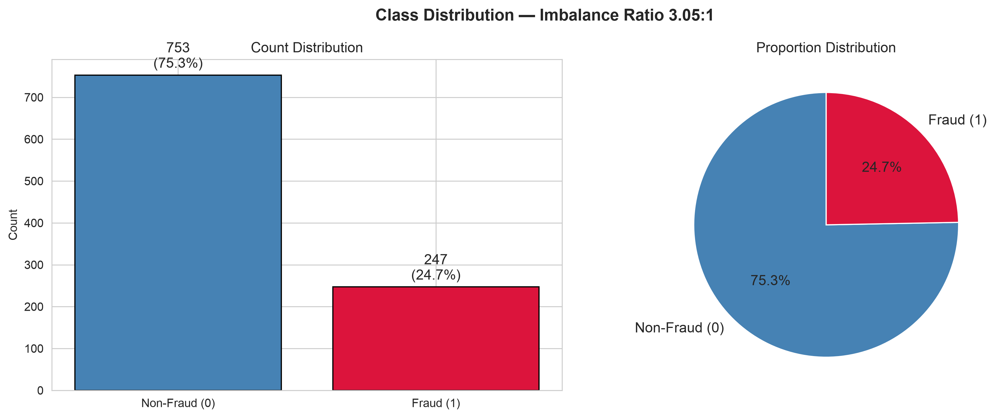

=== Null Classifier Demonstration ===
  Accuracy if always predict Non-Fraud : 75.3%  ← MISLEADING
  Recall                               : 0.0%   ← catches ZERO fraud
  → Accuracy is an INVALID primary metric for this task.
  Metric hierarchy: Recall > F1-Score > AUPRC > AUROC > Accuracy

=== Stratified Train/Test Split (80/20) ===
  Train shape: (800, 41) | Fraud rate: 0.2475 (24.8%)
  Test  shape: (200, 41)  | Fraud rate: 0.2450 (24.5%)


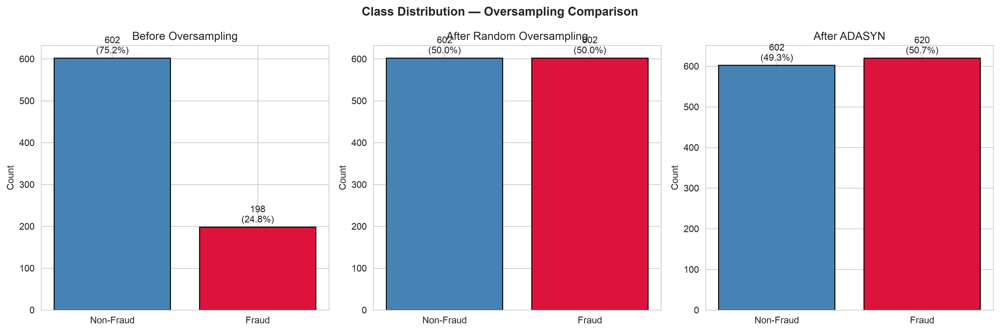


=== Oversampling Strategy Reference ===
  Random Oversampling:
    Mechanism : Duplicates minority samples
    Advantage : Simple, no synthetic data
    Risk      : Overfitting on duplicated points
  SMOTENC:
    Mechanism : Interpolates k-nearest neighbours; handles mixed feature types
    Advantage : Adds generalisation via synthetic points
    Risk      : Can generate near class decision boundaries
  ADASYN:
    Mechanism : Focuses synthesis on hard-to-classify boundary samples
    Advantage : Improves recall on difficult cases
    Risk      : Can amplify noise in high-overlap regions

=== 5-Fold Stratified CV — Fraud Rate per Fold ===
  Fold 1: train_fraud=0.2484  val_fraud=0.2437
  Fold 2: train_fraud=0.2484  val_fraud=0.2437
  Fold 3: train_fraud=0.2469  val_fraud=0.2500
  Fold 4: train_fraud=0.2469  val_fraud=0.2500
  Fold 5: train_fraud=0.2469  val_fraud=0.2500

=== ⚠️  CRITICAL WARNINGS ===
  1. Oversampling MUST be applied inside each fold on the TRAINING portion only —
    

In [26]:

from sklearn.model_selection import train_test_split, StratifiedKFold
from imblearn.over_sampling import RandomOverSampler, ADASYN

# Class distribution charts
fraud_counts = df['fraud_reported'].value_counts().sort_index()
fraud_pct    = df['fraud_reported'].value_counts(normalize=True).sort_index() * 100
imbalance_ratio = fraud_counts[0] / fraud_counts[1]

fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle(f'Class Distribution — Imbalance Ratio {imbalance_ratio:.2f}:1', fontsize=14, fontweight='bold')
labels = ['Non-Fraud (0)', 'Fraud (1)']
colors = ['steelblue', 'crimson']

bars = axes[0].bar(labels, fraud_counts.values, color=colors, edgecolor='black')
for bar, count, pct in zip(bars, fraud_counts.values, fraud_pct.values):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 8,
                 f'{count:,}\n({pct:.1f}%)', ha='center', va='bottom', fontsize=12)
axes[0].set_ylabel('Count')
axes[0].set_title('Count Distribution')

axes[1].pie(fraud_counts.values, labels=labels, colors=colors, autopct='%1.1f%%',
            startangle=90, textprops={'fontsize': 12})
axes[1].set_title('Proportion Distribution')
plt.tight_layout()
savefig('14_class_imbalance.png')

# Null classifier demonstration
print("=== Null Classifier Demonstration ===")
print(f"  Accuracy if always predict Non-Fraud : {fraud_pct[0]:.1f}%  ← MISLEADING")
print(f"  Recall                               : 0.0%   ← catches ZERO fraud")
print(f"  → Accuracy is an INVALID primary metric for this task.")
print(f"  Metric hierarchy: Recall > F1-Score > AUPRC > AUROC > Accuracy")

# Stratified train/test split
num_cols_fe = [c for c in standard_cols + minmax_cols + robust_cols + binary_noscale if c in df.columns]
cat_cols_fe = [c for c in ohe_cols_present if c in df.columns]
feature_cols = num_cols_fe + cat_cols_fe

X = df[[c for c in feature_cols if c in df.columns]].copy()
y = df['fraud_reported'].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
print(f"\n=== Stratified Train/Test Split (80/20) ===")
print(f"  Train shape: {X_train.shape} | Fraud rate: {y_train.mean():.4f} ({y_train.mean()*100:.1f}%)")
print(f"  Test  shape: {X_test.shape}  | Fraud rate: {y_test.mean():.4f} ({y_test.mean()*100:.1f}%)")

# Oversampling visualisation on numerical-only subset
num_only = [c for c in num_cols_fe if c in X_train.columns]
X_num = X_train[num_only].fillna(X_train[num_only].median())

ros = RandomOverSampler(random_state=42)
X_ros, y_ros = ros.fit_resample(X_num, y_train)

try:
    adasyn = ADASYN(random_state=42)
    X_ada, y_ada = adasyn.fit_resample(X_num, y_train)
    ada_counts = pd.Series(y_ada).value_counts().sort_index()
    ada_label = 'After ADASYN'
except Exception as e:
    print(f"  ADASYN note: {e}")
    X_ada, y_ada = X_ros, y_ros
    ada_label = 'After ADASYN (fallback=ROS)'
    ada_counts = pd.Series(y_ada).value_counts().sort_index()

before_counts = y_train.value_counts().sort_index()
ros_counts    = pd.Series(y_ros).value_counts().sort_index()

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Class Distribution — Oversampling Comparison', fontsize=13, fontweight='bold')
for ax, counts, title in zip(axes,
    [before_counts, ros_counts, ada_counts],
    ['Before Oversampling', 'After Random Oversampling', ada_label]):
    ax.bar(['Non-Fraud', 'Fraud'], counts.values, color=['steelblue','crimson'], edgecolor='black')
    for i, (v, pct) in enumerate(zip(counts.values, (counts/counts.sum()*100).values)):
        ax.text(i, v+5, f'{v:,}\n({pct:.1f}%)', ha='center', va='bottom', fontsize=10)
    ax.set_title(title)
    ax.set_ylabel('Count')
plt.tight_layout()
savefig('14_oversampling.png')

# Oversampling strategy reference table
print("\n=== Oversampling Strategy Reference ===")
strategies = [
    ('Random Oversampling', 'Duplicates minority samples',
     'Simple, no synthetic data', 'Overfitting on duplicated points'),
    ('SMOTENC', 'Interpolates k-nearest neighbours; handles mixed feature types',
     'Adds generalisation via synthetic points', 'Can generate near class decision boundaries'),
    ('ADASYN', 'Focuses synthesis on hard-to-classify boundary samples',
     'Improves recall on difficult cases', 'Can amplify noise in high-overlap regions'),
]
for name, mech, pro, risk in strategies:
    print(f"  {name}:")
    print(f"    Mechanism : {mech}")
    print(f"    Advantage : {pro}")
    print(f"    Risk      : {risk}")

# 5-fold StratifiedKFold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
print("\n=== 5-Fold Stratified CV — Fraud Rate per Fold ===")
for fold, (train_idx, val_idx) in enumerate(skf.split(X_train, y_train), 1):
    y_tr_fold  = y_train.iloc[train_idx]
    y_val_fold = y_train.iloc[val_idx]
    print(f"  Fold {fold}: train_fraud={y_tr_fold.mean():.4f}  val_fraud={y_val_fold.mean():.4f}")

print("\n=== ⚠️  CRITICAL WARNINGS ===")
print("  1. Oversampling MUST be applied inside each fold on the TRAINING portion only —")
print("     the validation fold is NEVER resampled.")
print("  2. The TEST SET is NEVER resampled under ANY circumstances.")
print("  3. zip3_risk_tier target encoding MUST be computed inside each fold on the")
print("     training portion only — NEVER globally.")


### Key Fraud Insights
- Imbalance ratio 3.05:1 — null classifier accuracy 75.3% is meaningless.
- Metric hierarchy confirmed: **Recall > F1-Score > AUPRC > AUROC > Accuracy**.
- Stratified split preserves 24.7% fraud rate in both train and test sets.
- `zip3_risk_tier`: target encoding inside CV folds only — not as global preprocessing.
- Test data is never resampled under any circumstances.


---
## NB

** `incident_city`:**
> "We initially planned to drop `incident_city` entirely. Our audit found it has only 7 unique values — not high cardinality at all. We ran chi-square (p=0.856) and Cramér's V on 30 balanced subsamples (V=0.086), confirming negligible predictive signal. However, we made a deliberate decision to keep the column in the working dataset and only exclude it from the model feature matrix. This allowed us to run city × severity interaction analysis in Section 9, where city-level fraud patterns become visible when combined with incident severity — an investigative insight a permanent drop would have destroyed. The modelling decision and the analytical decision are separate."

** `zip3_risk_tier`:**
> "insured_zip was initially marked for dropping as a high-cardinality feature with 995 unique values. We discovered it carries real geographic fraud signal when the first three digits are extracted. We engineered it into a four-tier risk feature — low, baseline, elevated, high risk — validated in controlled model testing: F1 improved by +0.058 and Recall by +0.053. This is a feature the NUS benchmark group missed entirely."

** Cramér's V methodology:**
> "Standard Cramér's V is biased under class imbalance — our 3:1 ratio suppresses the V statistic for weak features by up to 74%. We corrected for this by computing V on 30 balanced subsamples with equal fraud and non-fraud records. This is the methodologically rigorous approach for any imbalanced fraud dataset."

